## **Libraries**

In [ ]:
import os
import shutil
import sys

import numpy as np
import pandas as pd

from skimage.io import imread, imshow
from skimage.transform import resize
from sklearn.metrics import accuracy_score,precision_score,recall_score,roc_curve
from sklearn.utils import shuffle


from keras.models import Model, load_model , Sequential
from keras.layers import Input,Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint,CSVLogger
from keras import backend as K
from keras.optimizers import Adam
from keras.losses import binary_crossentropy
import tensorflow as tf
from sklearn.utils import shuffle

import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import notebook
from IPython.display import clear_output

https://www.tensorflow.org/guide/keras

## Set Image parameters

In [ ]:
# Set some parameters
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

## **Load data**

In [ ]:
#Mount drive - provides access to your drive from this notebook
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
#TRAIN PATHS

#set folder paths for Augmented cancer images and its mask generated previously
TRAIN_PATH = '/gdrive/My Drive/projects/cancer_detection/train/augmented/images/'#Augmented cancer images
TRAIN_MASK_PATH = '/gdrive/My Drive/projects/cancer_detection/train/augmented/labels/'#Masks for the same images

#save model outputs - model weights,architectures,hidden layer outputs,end of epoch outputs,model graphs
OUTPUT_PATH = '/gdrive/My Drive/projects/cancer_detection/outputs'

## Save model architecures and outputs

### Load Train data

In [ ]:
#Get train filenames from TRAIN_PATH folder
train_ids = pd.Series(os.listdir(TRAIN_PATH))

#Sample train filenames
train_ids.head()

0    cancer_103_4609224.png
1     cancer_63_1517897.png
2        cancer_0_17196.png
3     cancer_18_3244159.png
4       cancer_89_88578.png
dtype: object

In [ ]:
train_ids.str.startswith('cancer').sum()

660

#### 1000 cancer images will be loaded. It may take 15-20 minutes

In [ ]:
#Load Train data
# Get and resize train images and masks

#Train cancer images of shape ( Total number of images , 128 , 128)
X_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.float32)

#Train masks/labels of shape ( Total number of images , 128 , 128)
#Set dtype to boolean to highlight Cancer pixels in the mask image.
Y_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1),dtype=np.bool)

print('Getting and resizing train images and masks ... ')

for n, id_ in notebook.tqdm(enumerate(train_ids), total=len(train_ids)):

    img = imread(fname = TRAIN_PATH + id_)
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH,IMG_CHANNELS))
    X_train[n] = img

    mask = imread(fname = TRAIN_MASK_PATH + id_)
    mask = resize(mask, (IMG_HEIGHT, IMG_WIDTH ,1))
    #mask = mask / 255

    Y_train[n] = mask

print('Done!')

Getting and resizing train images and masks ... 



Done!


### Prepared data shape

In [ ]:
print("X_train shape:",X_train.shape)
print("Y_train shape:",Y_train.shape)

X_train shape: (1100, 128, 128, 3)
Y_train shape: (1100, 128, 128, 1)


In [ ]:
# Centering the data
#X_train = (X_train - X_train.mean()) / X_train.std()

### Verify pixel range of Train data

In [ ]:
print("Train images pixel range - ",np.min(X_train)," to ",np.max(X_train))
print("Train images pixel masks - ",np.min(Y_train)," to ",np.max(Y_train))

Train images pixel range -  0.0  to  1.0
Train images pixel masks -  False  to  True


## Utility functions

In [ ]:
# Clean directories if exists else create
def refresh_directory(path):

    #If segmentation / classification path doesn't exist, create folders else clean folders
    if not(os.path.isdir(path)):
      os.mkdir(path)
      os.mkdir(os.path.join(path , 'model'))
      os.mkdir(os.path.join(path , 'output after each epoch'))
      os.mkdir(os.path.join(path , 'output after each layer'))
      os.mkdir(os.path.join(path , 'graphs'))
    else:
      delete_folder_contents(os.path.join(path , 'model'))
      delete_folder_contents(os.path.join(path , 'output after each epoch'))
      delete_folder_contents(os.path.join(path , 'output after each layer'))
      delete_folder_contents(os.path.join(path , 'graphs'))

In [ ]:
def delete_folder_contents(folder):
  
  for filename in os.listdir(folder):
    file_path = os.path.join(folder, filename)
    try:
        if os.path.isfile(file_path) or os.path.islink(file_path):
            os.unlink(file_path)
        elif os.path.isdir(file_path):
            shutil.rmtree(file_path)
    except Exception as e:
        print('Failed to delete %s. Reason: %s' % (file_path, e))    

### Keras callback - perform operations during training 

https://keras.io/api/callbacks/

In [ ]:
class DisplayCallback(tf.keras.callbacks.Callback):
  
  #Called on end of epoch(epoch is full iteration over complete train dataset)
  def on_epoch_end(self, epoch, logs=None):
    #clear_output(wait=True)

    #Show prediction for and image after every epoch end
    show_predictions(epoch , self.model.name)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))
  
  #Called on begining of train
  def on_train_begin(self , logs=None):

    #Model name - segmentation / classification
    model_name = self.model.name
    if(model_name == 'seg_model'):
        
        # Clean directories if exists else create
        refresh_directory(os.path.join(OUTPUT_PATH , 'segmentation'))

    elif(model_name == 'classify_model'):
        refresh_directory(os.path.join(OUTPUT_PATH , 'classification'))
  
  #Called on end of train
  def on_train_end(self, logs = None):

    model_name = self.model.name
    if(model_name == 'seg_model'):
        
        # Display and save intermediate hidden layer outputs as images for segmentation
        get_hidden_layer_outputs(self.model.input , self.model.layers ,self.model.name)

    elif(model_name == 'classify_model'):

        #Same as above.Display and save only till layer 9. After that outputs will be transformed to 1 dimentional Dense layer
        get_hidden_layer_outputs(self.model.input , self.model.layers[0:9] ,self.model.name)
    


### Output after each epoch

In [ ]:
#Predict image and call display
def show_predictions(epoch , model_name):

    if(model_name == 'seg_model'):
      #Select an image - change X_train[0] to any valid input image
      img = np.expand_dims(X_train[0] , axis =0)

      #Predict 
      pred_mask = seg_model.predict(img)
      display([X_train[0], Y_train[0], pred_mask] , epoch)
    '''
    if(model_name == 'classify_model'):
      img = np.expand_dims(classification_x_train[0] , axis =0)
      print(img.shape)
      pred = classify_model.predict(img)
      fig = plt.figure(figsize=(5, 5))
      plt.title('input image')
      imshow(np.squeeze(img))
      plt.show()
      print('\nclassification_y_train[0] :',classification_y_train[0].astype(np.float32),'\n')
      print('\prediction] :',pred[0][0])
      print('-------------------------------------------------------------')
    '''

In [ ]:
#Display ['Input Image', 'True Mask', 'Predicted Mask']
def display(display_list , epoch):
  fig = plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    #plt.imsave(fname= os.path.join(OUTPUT_PATH , 'segmentation' , 'output after each epoch' , 'epoch_' + title[i] + str(epoch)) , arr = np.squeeze(display_list[i]) ,format = 'png')
    imshow(np.squeeze(display_list[i]))
    #plt.axis('off')

  #Save figures in google drive
  fig.savefig(os.path.join(OUTPUT_PATH , 'segmentation' , 'output after each epoch' , 'epoch_' + str(epoch)))
  plt.show()

## Output of hidden layers

In [ ]:
# Display and save hidden layer outputs
def get_hidden_layer_outputs(model_input , model_layers , model_name ):
  if(model_name == 'seg_model'):

      folder = 'segmentation'
      img = np.expand_dims(X_train[0] , axis=0)
  else:
      folder = 'classification'
      img = np.expand_dims(classification_x_train[0] , axis=0)

  # Extracts all ayers except input and output layer
  layer_outputs = [layer.output for layer in model_layers]

  # Creates a model that will return these outputs, given the model input
  activation_model = Model(inputs=model_input, outputs=layer_outputs)

  # Activations of all 40 layers for a selected input image
  activations = activation_model.predict(img)

  #Layer names
  layer_names = [layer.name for layer in model_layers]

  print("\n\nOutput of each layer for an image after training\n\n")

  for n ,(layer_name, layer_activation) in enumerate(zip(layer_names, activations)): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    #print(n_features)
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    #print(size)
    if(n_features < 16):
      n_rows = 1
      images_per_row = n_features
    else:
      images_per_row = 16
      n_rows = n_features // images_per_row # Tiles the activation channels in this matrix
    #print(n_cols)
    display_grid = np.zeros((size * n_rows, images_per_row * size))
    #print(display_grid.shape)
    for row in range(n_rows): # Tiles each filter into a big horizontal grid
        for col in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             row * images_per_row + col]
            #channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            #channel_image /= channel_image.std()
            #channel_image *= 64
            #channel_image += 128
            #channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[row * size : (row + 1) * size, # Displays the grid
                         col * size : (col + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)

    plt.imshow(display_grid, aspect='auto', cmap='viridis')  
    plt.imsave(os.path.join(OUTPUT_PATH , folder , 'output after each layer' , 'layer_' + str(n) +'_'+ layer_name) , arr = display_grid , format = 'png' )

### save model architecure

In [ ]:
def plot_and_save_model_architecure(model):
  if(model.name == 'seg_model'):
    model_architecure_path = os.path.join(OUTPUT_PATH,'model architecure','segmentation_model.png')
  if(model.name == 'classify_model'):
    model_architecure_path = os.path.join(OUTPUT_PATH,'model architecure','classification_model.png')

  if not(os.path.isdir(os.path.join(OUTPUT_PATH,'model architecure'))):
    os.mkdir(os.path.join(OUTPUT_PATH,'model architecure'))
  if os.path.isfile(model_architecure_path):
    os.unlink(model_architecure_path)
  return tf.keras.utils.plot_model(model , to_file=model_architecure_path, show_shapes=True  ,rankdir='TB')

## Segmentation

 ### Segmentation evaluation metrics

Segmentation evaluation is done by matching each pixel of Ground truth mask to the predicted mask

Usual Segmentation evaluation metrics are , Dice coeffecient , Jaccard coeffecient and pixel accuracy.


---


Note:

* TP = Number of pixels correctly identified as part cancer cells.
* TN = Number of pixels correctly identified as part of non - cancerous.
* FP = Number of pixels incorrectly identified as part of cancer cells.
* FN = Number of pixels incorrectly identified as part of non - cancerous.


---



**Pixel accuracy**: 

Pixel accuracy = (TP + TN) / (TP + TN + FP + FN)

Pixel accuracy is highly biased evaluation for cancer detection. Accuracy could be more than 90% even if 0 cancer cells segmented.



---



**Dice coeffecient / F1 score**:

Given two images img_true(ground truth image) and img_pred(predicted image)

Dice coeffecient = 2 * |img_true intersection img_pred| /( |img_true| + |img_pred|)

| | - represents cardinality or number of elements in the set

For image of boolean data type(black and white image),

|img_true intersection img_pred| is same as TP.

|img_true| = TP + FN

|img_pred| = TP + FP

So above formula for dice coffecient can also be written as

dice coffecient = 2TP / (2TP + FP + FN)

Dice coeffecient penalises instnces of bad classification unlike Pixel accuracy

Link: https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient



---



Note: 
Dice coffecient has disdavntages. It overstates the importance of sets with little-to-no actual ground truth positive sets. In the common example of image segmentation, if an image only has a single pixel of some detectable class, and the classifier detects that pixel and one other pixel, its F score is a lowly 2/3 and the IoU is even worse at 1/2. Trivial mistakes like these can seriously dominate the average score taken over a set of images. In short, it weights each pixel error inversely proportionally to the size of the selected/relevant set rather than treating them equally.







In [ ]:
#dice_coef
#smooth = 1 used to solve 0/0 and 1/0 cases. It also used because it can bump accuracy a bit which is lost by non evaluation of TN.
def dice_coef(y_true, y_pred, smooth=1):

    #Convert all pixels of y_true and y_pred to 1 or 0 based on threshold.
    #y_true = K.cast(y_true > 0.5 , dtype='float16')
    #y_pred = K.cast(y_pred > 0.5 , dtype='float16')

    #Find interesection of y_true and y_pred
    #Count total number of cancer cells
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])

    #union = Number of cancer cells in y_true + number of cancer cells in y_pred
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])

    #Return average segmentaion over all images
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)

## Neural related explainitation links

* Objective/Loss functiion: Binary cross enthropy /logloss(Mininimize this quantity to improve the model after each iteration)

https://towardsdatascience.com/understanding-binary-cross-entropy-log-loss-a-visual-explanation-a3ac6025181a

* Gradient descent: iterative optimization algorithm to find the minimum Objective/Loss functiion

https://towardsdatascience.com/an-intuitive-explanation-of-gradient-descent-83adf68c9c33

* Forward and backword propogation: Algorithm used to update weights of the model iteratively and train the model

https://www.youtube.com/watch?v=qzPQ8cEsVK8

* Regularization in NN: Techniques used to reduce overfitting

https://www.analyticsvidhya.com/blog/2018/04/fundamentals-deep-learning-regularization-techniques/

* optimizer - Adaptive learning rate optimization algorithm

https://towardsdatascience.com/adam-latest-trends-in-deep-learning-optimization-6be9a291375c

* Activations - Activation functions are mathematical equations that determine the output of a neural network. The function is attached to each neuron in the network, and determines whether it should be activated (“fired”) or not, based on whether each neuron's input is relevant for the model's prediction.

https://towardsdatascience.com/activation-functions-neural-networks-1cbd9f8d91d6

* Kernel intializer:  kernel_initializer is a fancy term for which statistical distribution or function to use for initialising the weights of NN




## Convolutional neural netowrk explination links

* CNN - https://cs231n.github.io/convolutional-networks/#overview

* transpose convolution layer - 

https://medium.com/activating-robotic-minds/up-sampling-with-transposed-convolution-9ae4f2df52d0

https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose


[A guide to convolution arithmetic for deep learning](https://arxiv.org/abs/1603.07285v1)




## Segmentation Model


### U-net model :

paper - https://arxiv.org/abs/1505.04597

http://deeplearning.net/tutorial/unet.html


### Model Hyper paramters

*All Conv2D convolutional layers have following parameters:*

* Activation = 'Elu' (Exponential Linear Unit) . Faster and higher accuracies for classification tasks compared to usual 'Relu'(Rectified Linear activation) function. Elu also mitigates the need for batch normalization which saves computation time.

https://www.tensorflow.org/api_docs/python/tf/keras/layers/ELU

paper : https://arxiv.org/abs/1511.07289



* Kernel intializer = 'He_normal'. Works well for deep neural networks by avoiding vanishing or exploding gradient problem.It does so, by ensuring the weights of each layer is intialized based on the depth of NN and size of hidden layer

https://www.tensorflow.org/api_docs/python/tf/keras/initializers/he_normal

paper - https://www.cv-foundation.org/openaccess/content_iccv_2015/html/He_Delving_Deep_into_ICCV_2015_paper.html

* filter size : (3,3)

* pading = 'same'. Ensures feature map will have same size as input. Ensures importances of edges of the image during convolution operation.

* stride = 1

*Transpose convolution layers parameters : Equilant upsampling + Conv2D*

* No activation applied
* filter size : (2,2)
* Stride = (2,2) (stride in transpose convolution behaves opposite to stride in convolution layer)
* padding = 'same

In [ ]:
# Build U-Net model
def get_seg_model():
  
  #Input image of size(128,128,3)
  inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

  # Contracting path]

  # layer 1
 
  #Perform convolution by applying 16 convolution filters of size (3,3) to input image
  c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (inputs)
  #Dropout rate set to 10% . Regularization technique used to reduce overfitting. Drops 10 % of the nodes of the c1 output randomly.
  c1 = Dropout(0.1) (c1)
  #Perform convolution by applying 16 convolution filters of size (3,3) to output of drop out layer
  c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
  #Apply Max pooling to output of Elu activation with filter size = (2,2) and stride = (2,2)
  p1 = MaxPooling2D((2, 2)) (c1)

  # layer 2

  #Perform convolution by applying 32 convolution filters of size (3,3) ouput of layer 2
  c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
  #Dropout rate set to 10% .
  c2 = Dropout(0.1) (c2)
  #Perform convolution by applying 32 convolution filters of size (3,3) ouput of  drop out layer
  c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
  #Apply Max pooling to output of Elu activation with filter size = (2,2) and stride = (2,2)
  p2 = MaxPooling2D((2, 2)) (c2)

  # layer 3

  #Perform convolution by applying 64 convolution filters of size (3,3) ouput of layer 2
  c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
  #Dropout rate set to 10% .
  c3 = Dropout(0.2) (c3)
  #Perform convolution by applying 64 convolution filters of size (3,3) ouput of  drop out layer
  c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
  #Apply Max pooling to output of Elu activation with filter size = (2,2) and stride = (2,2)
  p3 = MaxPooling2D((2, 2)) (c3)

  # layer 4

  #Perform convolution by applying 128 convolution filters of size (3,3) ouput of layer 3
  c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
  #Dropout rate set to 10% .
  c4 = Dropout(0.2) (c4)
  #Perform convolution by applying 128 convolution filters of size (3,3) ouput of  drop out layer
  c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c4)
  #Apply Max pooling to output of Elu activation with filter size = (2,2) and stride = (2,2)
  p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

  # layer 5

  #Middle/Bottleneck

  #Perform convolution by applying 256 convolution filters of size (3,3) ouput of layer 4
  c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
  #Dropout rate set to 10% .
  c5 = Dropout(0.3) (c5)
  #Perform convolution by applying 256 convolution filters of size (3,3) ouput of  drop out layer
  c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)


  #Expanding path

  # layer 6

  #Apply transpose convolution with 128 filters
  u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
  #Concatenate Conv2DTranspose output with layer 4 output to reconstruct the segmented image.
  u6 = concatenate([u6, c4])

  #Following Conv2d oprations on the concatenated image will reconstruct segmented image by combining localized information from u6 with global information of c4. 
  #Perform convolution by applying 128 convolution filters of size (3,3) to concatenated image
  c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
  #Drop out set 20%
  c6 = Dropout(0.2) (c6)
  #Perform convolution by applying 128 convolution filters of size (3,3) to ouput of  drop out layer
  c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c6)

  # layer 7

  #Apply transpose convolution with 64 filters
  u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
  #Concatenate Conv2DTranspose output with layer 3 output to reconstruct the segmented image.
  u7 = concatenate([u7, c3])
  #Perform convolution by applying 64 convolution filters of size (3,3) to concatenated image
  c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
  #Drop out set 20%
  c7 = Dropout(0.2) (c7)
  #Perform convolution by applying 64 convolution filters of size (3,3) to ouput of  drop out layer
  c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

  # layer 8

  #Apply transpose convolution with 32 filters
  u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
  #Concatenate Conv2DTranspose output with layer 2 output to reconstruct the segmented image.
  u8 = concatenate([u8, c2])
  #Perform convolution by applying 32 convolution filters of size (3,3) to concatenated image
  c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
  #Drop out set 20%
  c8 = Dropout(0.1) (c8)
  #Perform convolution by applying 32 convolution filters of size (3,3) to ouput of  drop out layer
  c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

  #layer 9

  #Apply transpose convolution with 16 filters
  u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
  #Concatenate Conv2DTranspose output with layer 1 output to reconstruct the segmented image.
  u9 = concatenate([u9, c1], axis=3)
  #Perform convolution by applying 16 convolution filters of size (3,3) to concatenated image
  c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
  #Drop out set 20%
  c9 = Dropout(0.1) (c9)
  #Perform convolution by applying 16 convolution filters of size (3,3) to ouput of  drop out layer
  c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

  # Output with sigmoid activation : Classifies each pixel with probablity value between 0 and 1.

  # (1,1) convolution applied to reduce the number of channels to 1
  outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

  #Create model with given inputs and outputs strcture
  seg_model = Model(inputs=[inputs], outputs=[outputs] , name = 'seg_model')
  
  #Configures the model for training by defining the loss function, the optimizer and the metrics
  #Loss function : binary_crossentropy
  #optmizer : adam
  #metrics : dice_coef , binary_accuracy
  seg_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coef,'binary_accuracy'])

  return seg_model

In [ ]:
#get a compiled instance of segmentation model
seg_model = get_seg_model()
#segmentation model summary
seg_model.summary()

Model: "seg_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 128, 128, 16) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 16) 2320        dropout[0][0]                    
__________________________________________________________________________________________

## Segmentation architecure


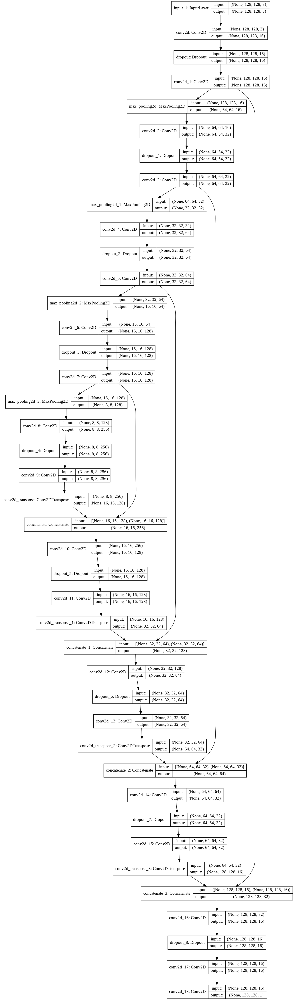

In [ ]:
#plot and save segmentation model
plot_and_save_model_architecure(seg_model)

## Fit model

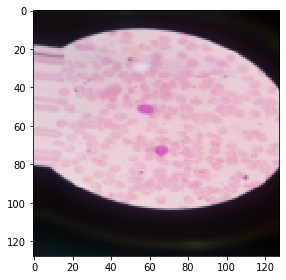

In [ ]:
imshow(np.squeeze(X_train[0]))

Epoch 1/500
28/28 [==============================] - 53s 182ms/step - loss: 0.1424 - dice_coef: 0.0074 - binary_accuracy: 0.9504 - val_loss: 0.0375 - val_dice_coef: 0.0063 - val_binary_accuracy: 0.9965

Epoch 00001: val_dice_coef improved from -inf to 0.00625, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


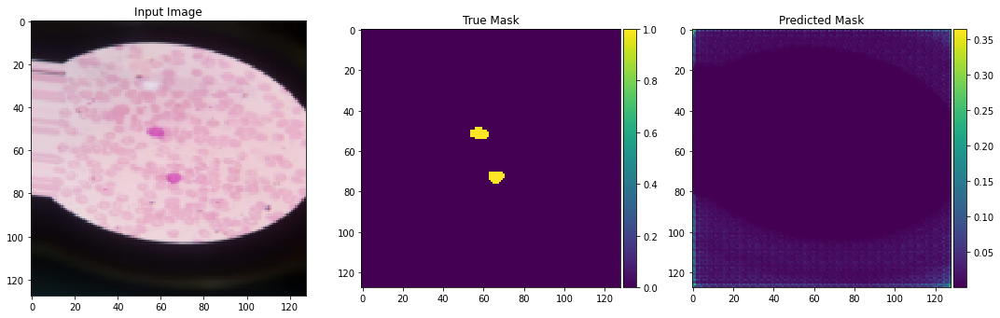


Sample Prediction after epoch 1

Epoch 2/500
28/28 [==============================] - 2s 85ms/step - loss: 0.0428 - dice_coef: 0.0078 - binary_accuracy: 0.9952 - val_loss: 0.0205 - val_dice_coef: 0.0174 - val_binary_accuracy: 0.9965

Epoch 00002: val_dice_coef improved from 0.00625 to 0.01744, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


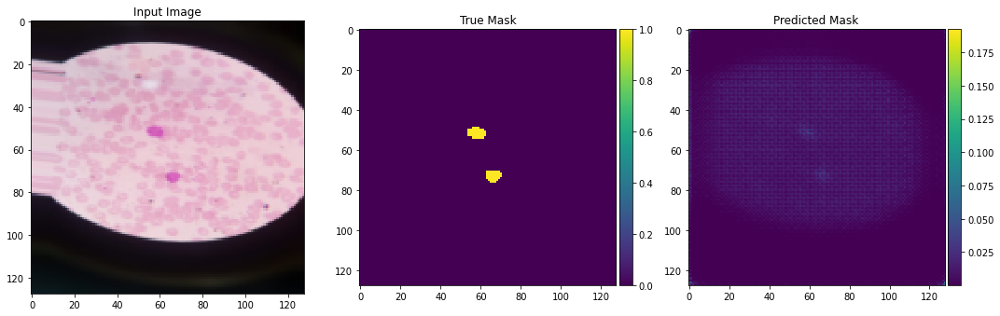


Sample Prediction after epoch 2

Epoch 3/500
28/28 [==============================] - 2s 86ms/step - loss: 0.0258 - dice_coef: 0.0181 - binary_accuracy: 0.9955 - val_loss: 0.0188 - val_dice_coef: 0.0206 - val_binary_accuracy: 0.9965

Epoch 00003: val_dice_coef improved from 0.01744 to 0.02058, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


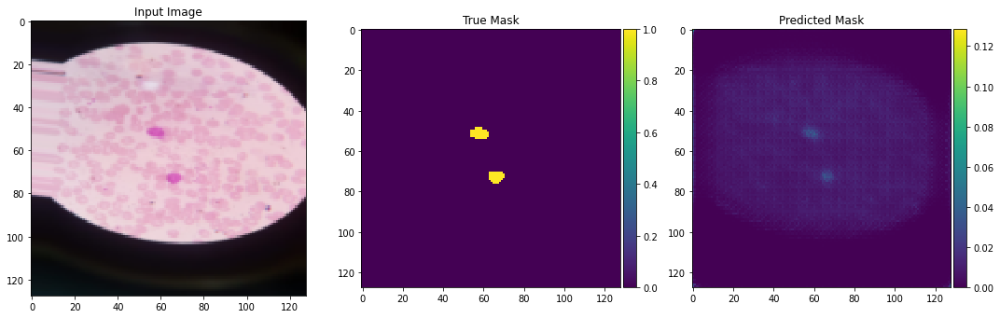


Sample Prediction after epoch 3

Epoch 4/500
28/28 [==============================] - 2s 86ms/step - loss: 0.0242 - dice_coef: 0.0241 - binary_accuracy: 0.9953 - val_loss: 0.0162 - val_dice_coef: 0.0319 - val_binary_accuracy: 0.9965

Epoch 00004: val_dice_coef improved from 0.02058 to 0.03194, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


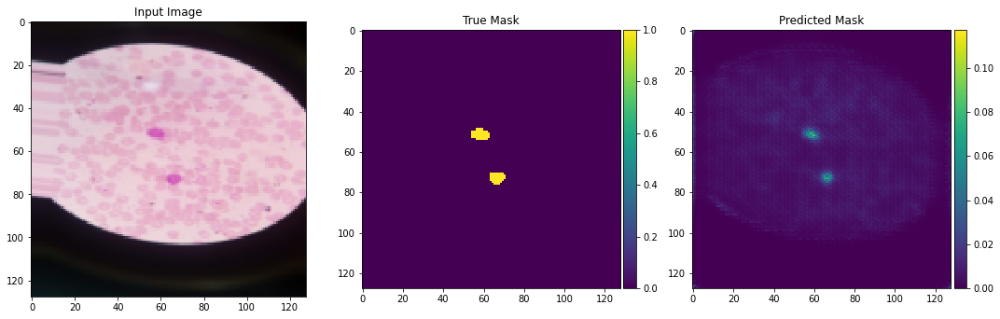


Sample Prediction after epoch 4

Epoch 5/500
28/28 [==============================] - 2s 87ms/step - loss: 0.0195 - dice_coef: 0.0446 - binary_accuracy: 0.9957 - val_loss: 0.0118 - val_dice_coef: 0.1204 - val_binary_accuracy: 0.9967

Epoch 00005: val_dice_coef improved from 0.03194 to 0.12043, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


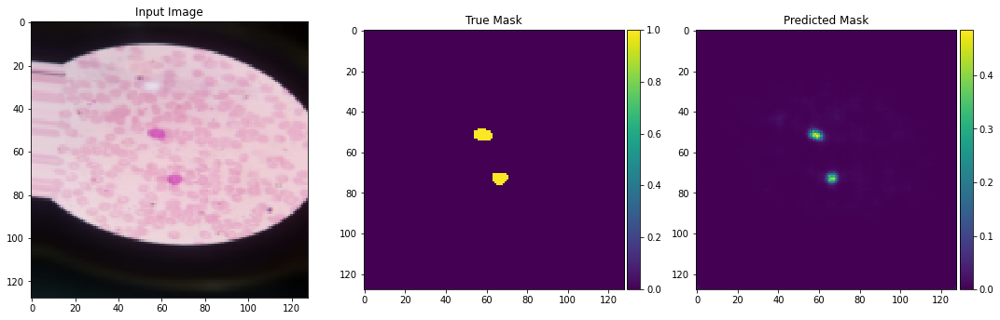


Sample Prediction after epoch 5

Epoch 6/500
28/28 [==============================] - 2s 87ms/step - loss: 0.0138 - dice_coef: 0.1424 - binary_accuracy: 0.9963 - val_loss: 0.0092 - val_dice_coef: 0.2588 - val_binary_accuracy: 0.9975

Epoch 00006: val_dice_coef improved from 0.12043 to 0.25876, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


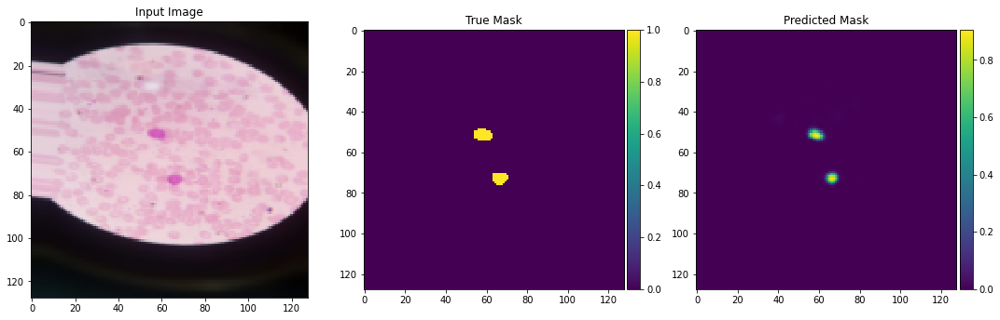


Sample Prediction after epoch 6

Epoch 7/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0128 - dice_coef: 0.2420 - binary_accuracy: 0.9966 - val_loss: 0.0085 - val_dice_coef: 0.2655 - val_binary_accuracy: 0.9977

Epoch 00007: val_dice_coef improved from 0.25876 to 0.26553, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


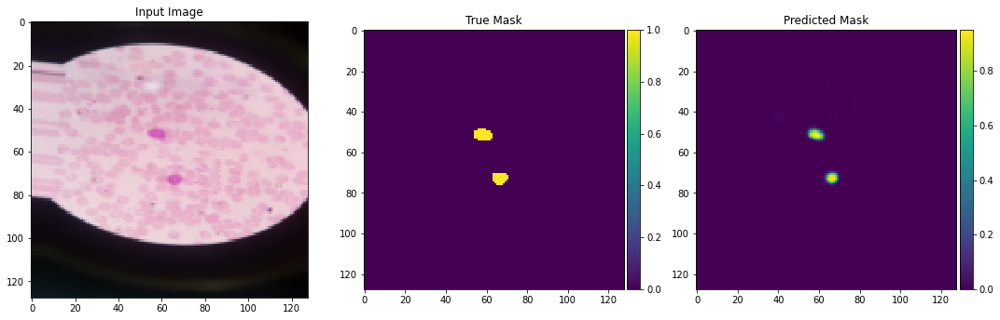


Sample Prediction after epoch 7

Epoch 8/500
28/28 [==============================] - 2s 88ms/step - loss: 0.0128 - dice_coef: 0.2815 - binary_accuracy: 0.9966 - val_loss: 0.0102 - val_dice_coef: 0.3970 - val_binary_accuracy: 0.9974

Epoch 00008: val_dice_coef improved from 0.26553 to 0.39697, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


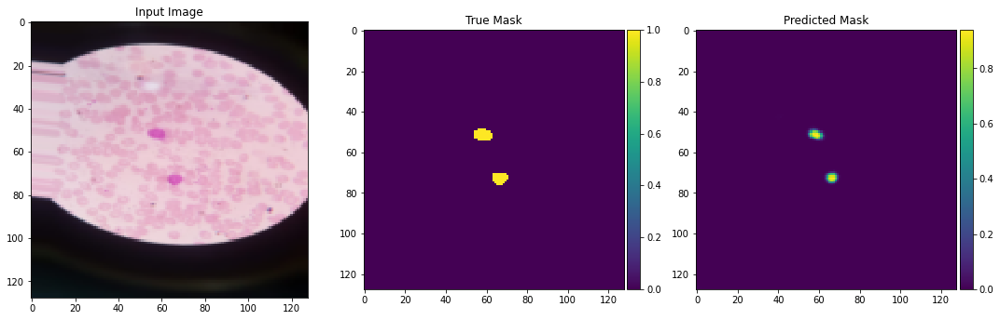


Sample Prediction after epoch 8

Epoch 9/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0109 - dice_coef: 0.3226 - binary_accuracy: 0.9970 - val_loss: 0.0100 - val_dice_coef: 0.4370 - val_binary_accuracy: 0.9974

Epoch 00009: val_dice_coef improved from 0.39697 to 0.43700, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


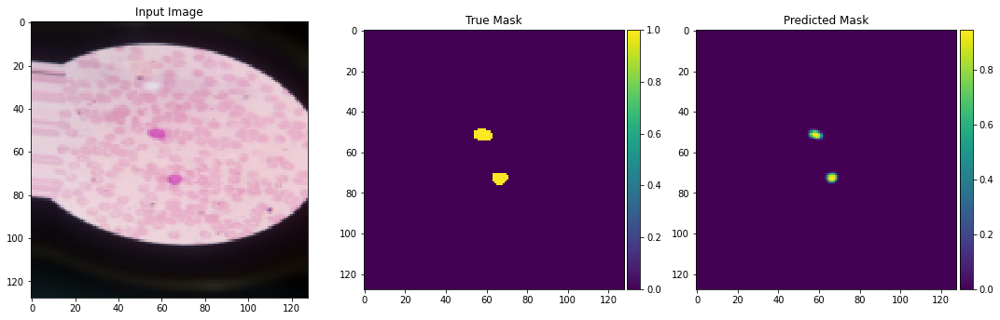


Sample Prediction after epoch 9

Epoch 10/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0099 - dice_coef: 0.3694 - binary_accuracy: 0.9971 - val_loss: 0.0134 - val_dice_coef: 0.5370 - val_binary_accuracy: 0.9972

Epoch 00010: val_dice_coef improved from 0.43700 to 0.53704, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


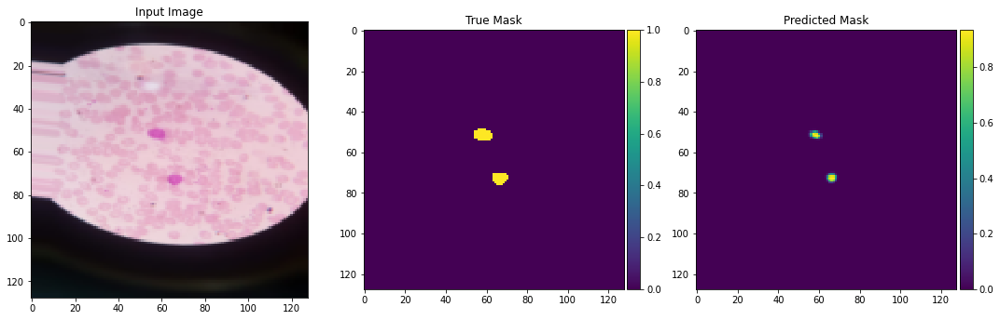


Sample Prediction after epoch 10

Epoch 11/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0097 - dice_coef: 0.4149 - binary_accuracy: 0.9971 - val_loss: 0.0091 - val_dice_coef: 0.5922 - val_binary_accuracy: 0.9977

Epoch 00011: val_dice_coef improved from 0.53704 to 0.59220, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


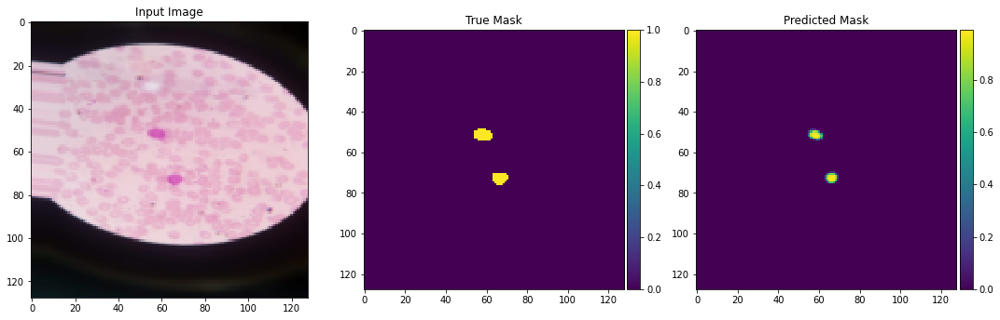


Sample Prediction after epoch 11

Epoch 12/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0074 - dice_coef: 0.4621 - binary_accuracy: 0.9977 - val_loss: 0.0089 - val_dice_coef: 0.6011 - val_binary_accuracy: 0.9977

Epoch 00012: val_dice_coef improved from 0.59220 to 0.60107, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


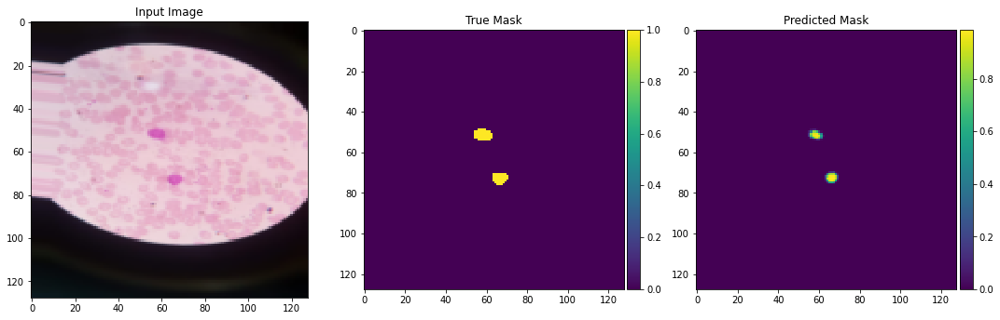


Sample Prediction after epoch 12

Epoch 13/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0063 - dice_coef: 0.4902 - binary_accuracy: 0.9979 - val_loss: 0.0096 - val_dice_coef: 0.6343 - val_binary_accuracy: 0.9977

Epoch 00013: val_dice_coef improved from 0.60107 to 0.63431, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


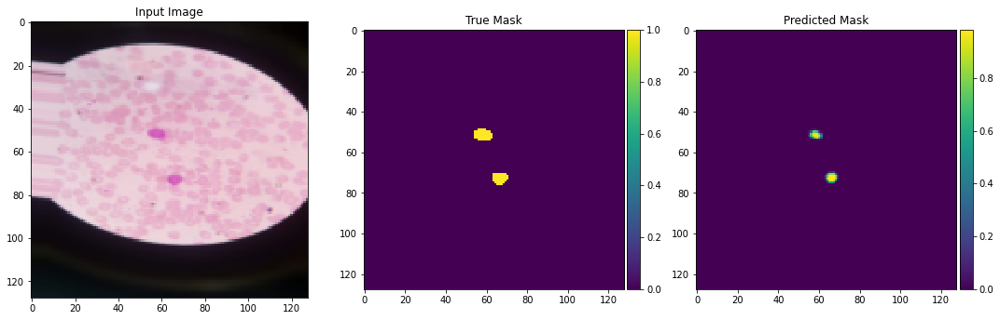


Sample Prediction after epoch 13

Epoch 14/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0070 - dice_coef: 0.4974 - binary_accuracy: 0.9976 - val_loss: 0.0124 - val_dice_coef: 0.6473 - val_binary_accuracy: 0.9975

Epoch 00014: val_dice_coef improved from 0.63431 to 0.64731, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


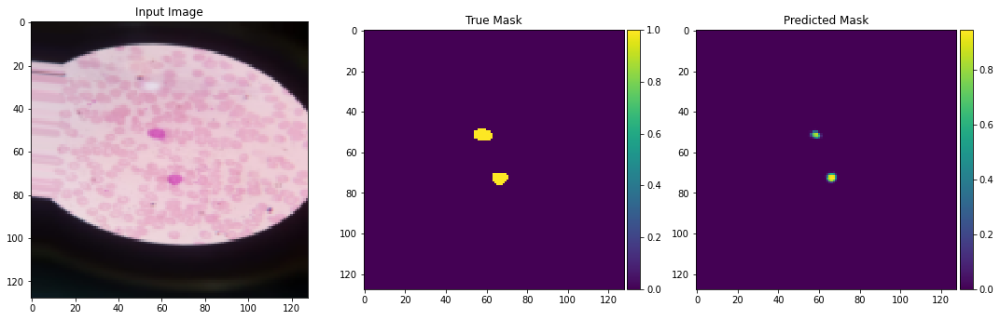


Sample Prediction after epoch 14

Epoch 15/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0071 - dice_coef: 0.5085 - binary_accuracy: 0.9976 - val_loss: 0.0086 - val_dice_coef: 0.6522 - val_binary_accuracy: 0.9978

Epoch 00015: val_dice_coef improved from 0.64731 to 0.65216, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


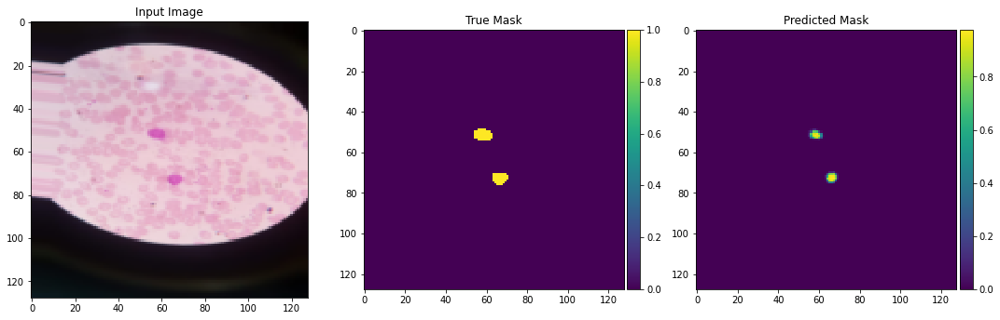


Sample Prediction after epoch 15

Epoch 16/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0064 - dice_coef: 0.5056 - binary_accuracy: 0.9977 - val_loss: 0.0135 - val_dice_coef: 0.6536 - val_binary_accuracy: 0.9974

Epoch 00016: val_dice_coef improved from 0.65216 to 0.65360, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


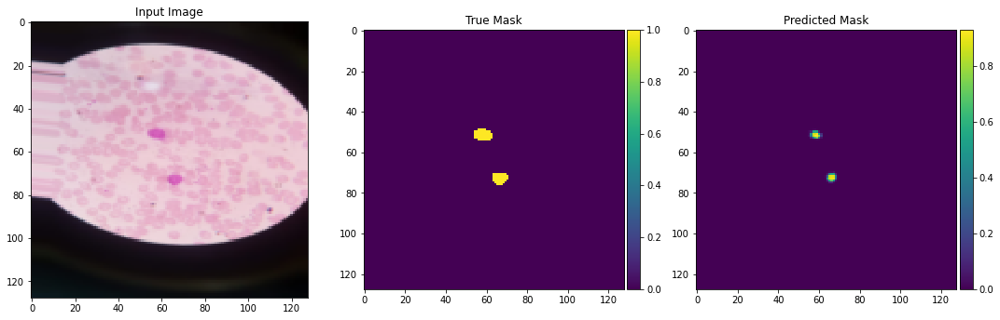


Sample Prediction after epoch 16

Epoch 17/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0059 - dice_coef: 0.5528 - binary_accuracy: 0.9979 - val_loss: 0.0087 - val_dice_coef: 0.7197 - val_binary_accuracy: 0.9979

Epoch 00017: val_dice_coef improved from 0.65360 to 0.71973, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


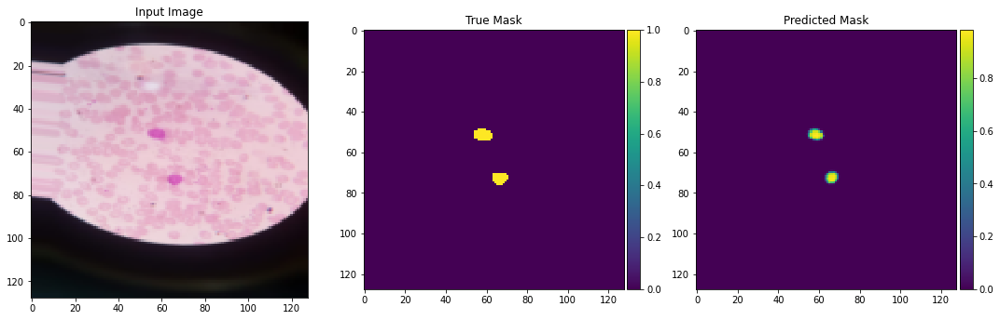


Sample Prediction after epoch 17

Epoch 18/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0060 - dice_coef: 0.5760 - binary_accuracy: 0.9979 - val_loss: 0.0053 - val_dice_coef: 0.7639 - val_binary_accuracy: 0.9983

Epoch 00018: val_dice_coef improved from 0.71973 to 0.76393, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


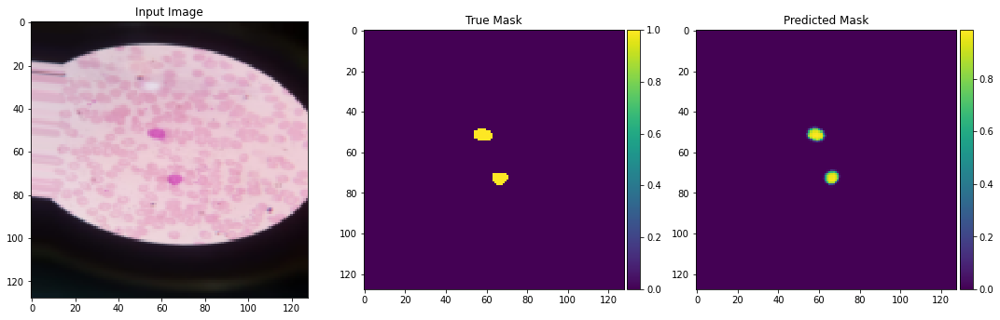


Sample Prediction after epoch 18

Epoch 19/500
28/28 [==============================] - 3s 96ms/step - loss: 0.0064 - dice_coef: 0.5820 - binary_accuracy: 0.9976 - val_loss: 0.0050 - val_dice_coef: 0.7839 - val_binary_accuracy: 0.9983

Epoch 00019: val_dice_coef improved from 0.76393 to 0.78387, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


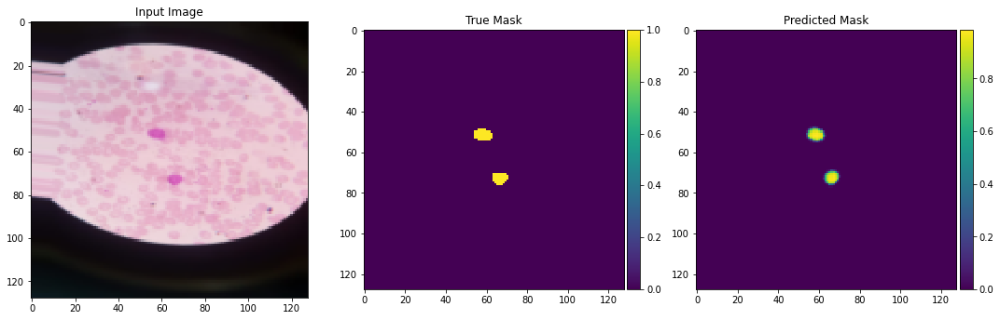


Sample Prediction after epoch 19

Epoch 20/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0056 - dice_coef: 0.5925 - binary_accuracy: 0.9980 - val_loss: 0.0062 - val_dice_coef: 0.7694 - val_binary_accuracy: 0.9982

Epoch 00020: val_dice_coef did not improve from 0.78387


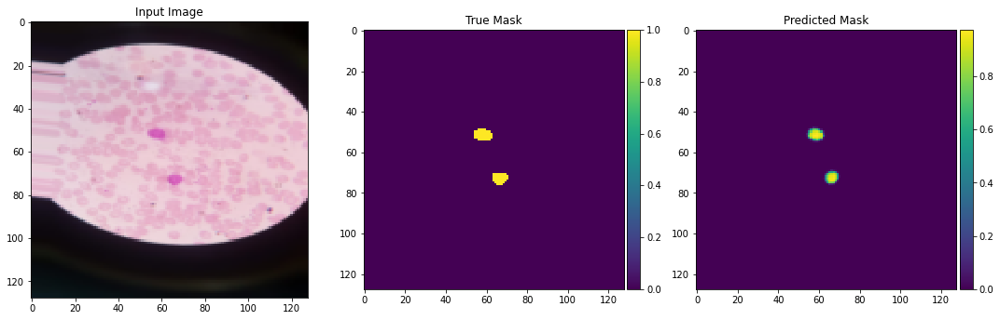


Sample Prediction after epoch 20

Epoch 21/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0051 - dice_coef: 0.6182 - binary_accuracy: 0.9980 - val_loss: 0.0077 - val_dice_coef: 0.7541 - val_binary_accuracy: 0.9980

Epoch 00021: val_dice_coef did not improve from 0.78387


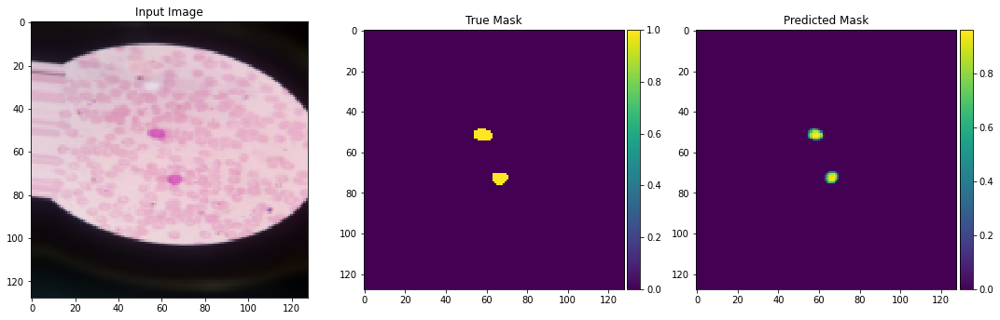


Sample Prediction after epoch 21

Epoch 22/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0050 - dice_coef: 0.6487 - binary_accuracy: 0.9981 - val_loss: 0.0066 - val_dice_coef: 0.7739 - val_binary_accuracy: 0.9981

Epoch 00022: val_dice_coef did not improve from 0.78387


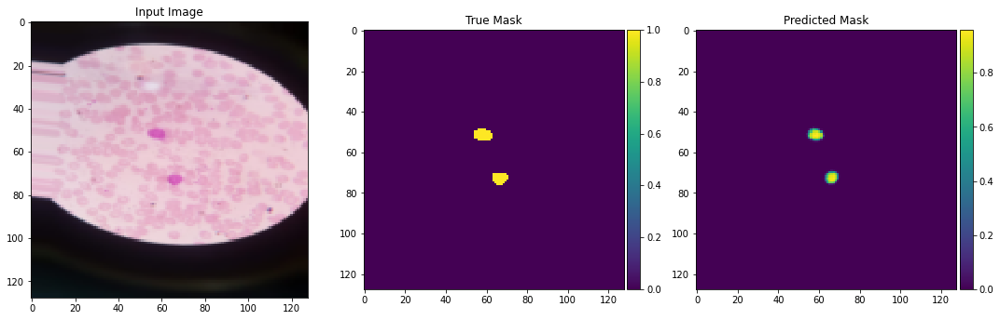


Sample Prediction after epoch 22

Epoch 23/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0048 - dice_coef: 0.6289 - binary_accuracy: 0.9982 - val_loss: 0.0057 - val_dice_coef: 0.7933 - val_binary_accuracy: 0.9983

Epoch 00023: val_dice_coef improved from 0.78387 to 0.79328, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


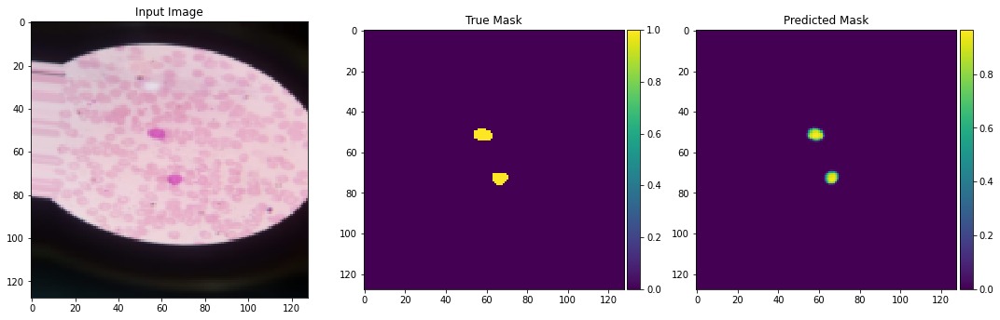


Sample Prediction after epoch 23

Epoch 24/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0052 - dice_coef: 0.6414 - binary_accuracy: 0.9979 - val_loss: 0.0043 - val_dice_coef: 0.8161 - val_binary_accuracy: 0.9985

Epoch 00024: val_dice_coef improved from 0.79328 to 0.81612, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


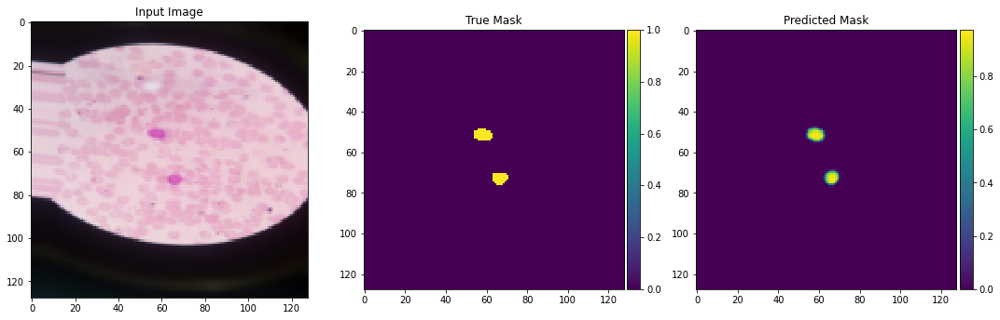


Sample Prediction after epoch 24

Epoch 25/500
28/28 [==============================] - 3s 95ms/step - loss: 0.0047 - dice_coef: 0.6166 - binary_accuracy: 0.9982 - val_loss: 0.0050 - val_dice_coef: 0.8018 - val_binary_accuracy: 0.9984

Epoch 00025: val_dice_coef did not improve from 0.81612


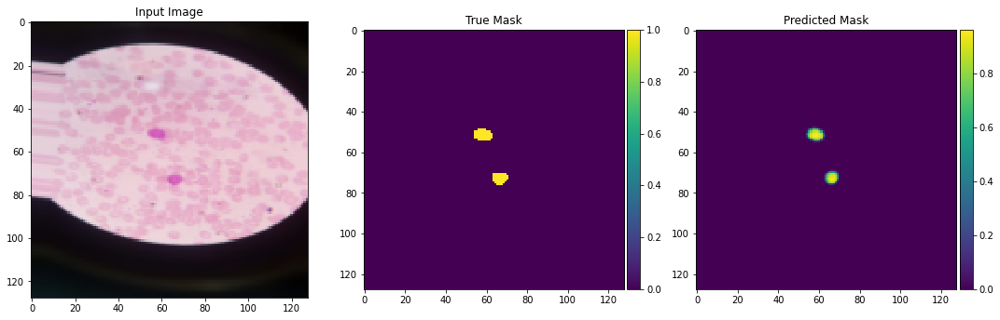


Sample Prediction after epoch 25

Epoch 26/500
28/28 [==============================] - 3s 94ms/step - loss: 0.0053 - dice_coef: 0.6464 - binary_accuracy: 0.9979 - val_loss: 0.0049 - val_dice_coef: 0.8148 - val_binary_accuracy: 0.9985

Epoch 00026: val_dice_coef did not improve from 0.81612


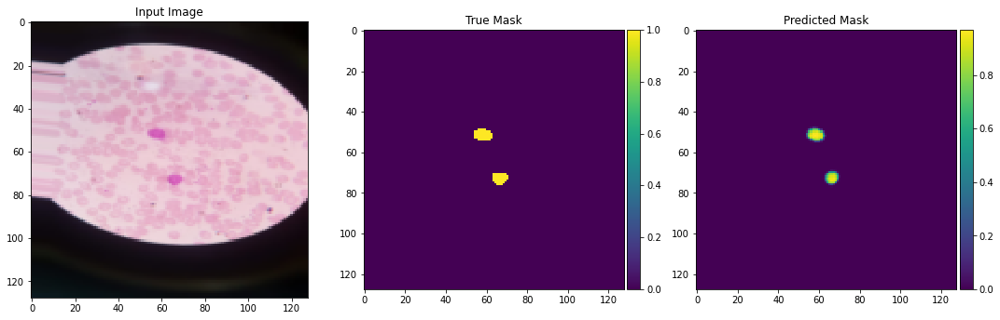


Sample Prediction after epoch 26

Epoch 27/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0042 - dice_coef: 0.7213 - binary_accuracy: 0.9983 - val_loss: 0.0047 - val_dice_coef: 0.8205 - val_binary_accuracy: 0.9985

Epoch 00027: val_dice_coef improved from 0.81612 to 0.82047, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


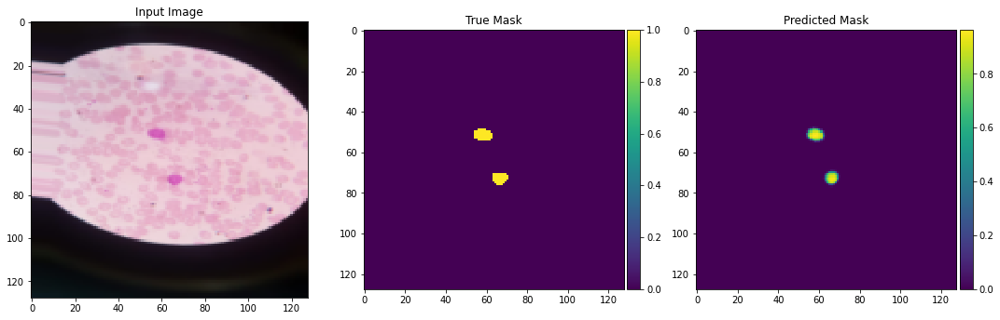


Sample Prediction after epoch 27

Epoch 28/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0047 - dice_coef: 0.6694 - binary_accuracy: 0.9982 - val_loss: 0.0058 - val_dice_coef: 0.8038 - val_binary_accuracy: 0.9984

Epoch 00028: val_dice_coef did not improve from 0.82047


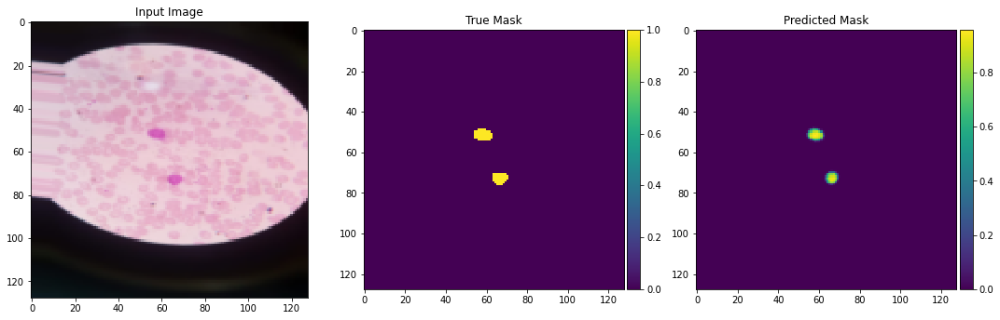


Sample Prediction after epoch 28

Epoch 29/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0043 - dice_coef: 0.7090 - binary_accuracy: 0.9983 - val_loss: 0.0045 - val_dice_coef: 0.8330 - val_binary_accuracy: 0.9986

Epoch 00029: val_dice_coef improved from 0.82047 to 0.83295, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


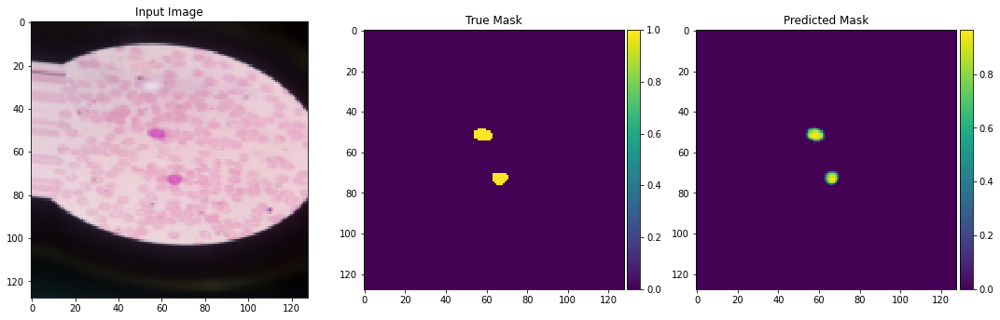


Sample Prediction after epoch 29

Epoch 30/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0040 - dice_coef: 0.6705 - binary_accuracy: 0.9985 - val_loss: 0.0051 - val_dice_coef: 0.8080 - val_binary_accuracy: 0.9985

Epoch 00030: val_dice_coef did not improve from 0.83295


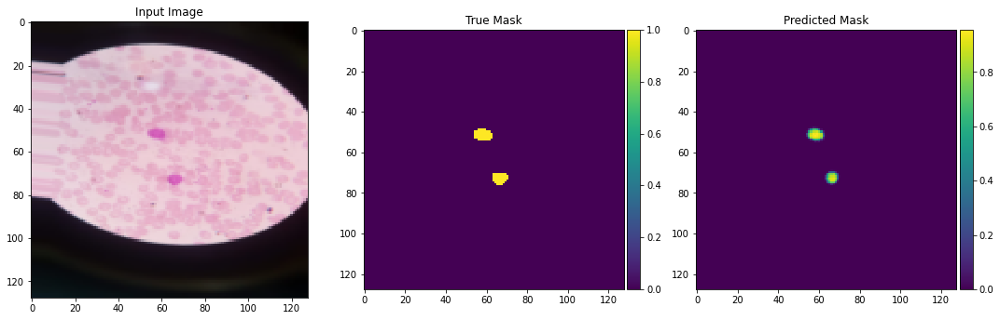


Sample Prediction after epoch 30

Epoch 31/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0043 - dice_coef: 0.7108 - binary_accuracy: 0.9983 - val_loss: 0.0043 - val_dice_coef: 0.8343 - val_binary_accuracy: 0.9986

Epoch 00031: val_dice_coef improved from 0.83295 to 0.83427, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


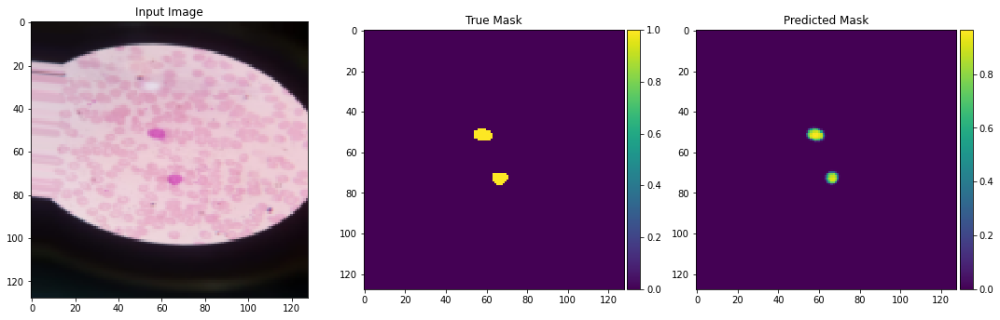


Sample Prediction after epoch 31

Epoch 32/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0042 - dice_coef: 0.7046 - binary_accuracy: 0.9983 - val_loss: 0.0052 - val_dice_coef: 0.8288 - val_binary_accuracy: 0.9985

Epoch 00032: val_dice_coef did not improve from 0.83427


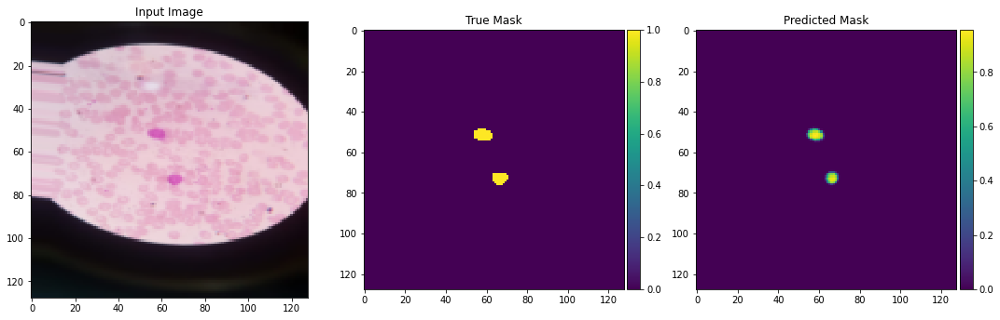


Sample Prediction after epoch 32

Epoch 33/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0040 - dice_coef: 0.7557 - binary_accuracy: 0.9985 - val_loss: 0.0038 - val_dice_coef: 0.8511 - val_binary_accuracy: 0.9987

Epoch 00033: val_dice_coef improved from 0.83427 to 0.85110, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


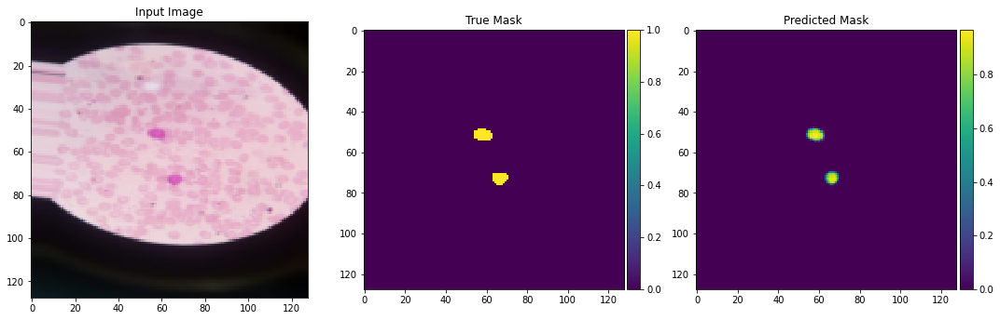


Sample Prediction after epoch 33

Epoch 34/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0038 - dice_coef: 0.7551 - binary_accuracy: 0.9985 - val_loss: 0.0031 - val_dice_coef: 0.8761 - val_binary_accuracy: 0.9989

Epoch 00034: val_dice_coef improved from 0.85110 to 0.87610, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


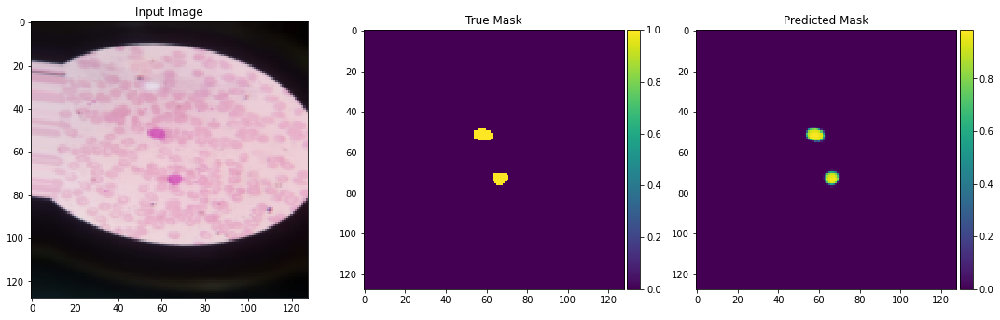


Sample Prediction after epoch 34

Epoch 35/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0034 - dice_coef: 0.7655 - binary_accuracy: 0.9987 - val_loss: 0.0036 - val_dice_coef: 0.8647 - val_binary_accuracy: 0.9988

Epoch 00035: val_dice_coef did not improve from 0.87610


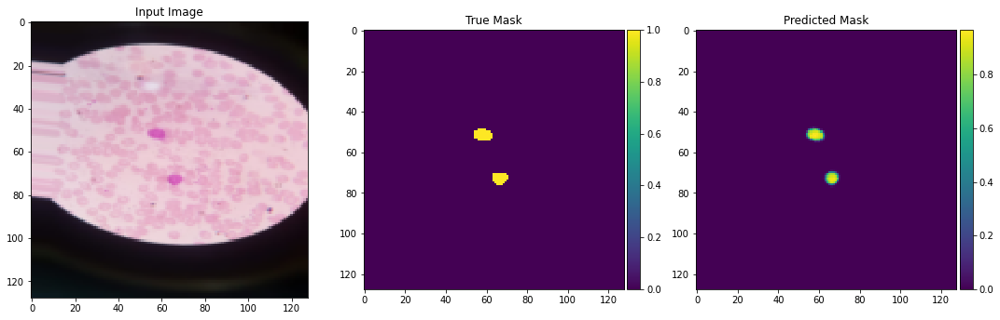


Sample Prediction after epoch 35

Epoch 36/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0037 - dice_coef: 0.7522 - binary_accuracy: 0.9986 - val_loss: 0.0033 - val_dice_coef: 0.8693 - val_binary_accuracy: 0.9988

Epoch 00036: val_dice_coef did not improve from 0.87610


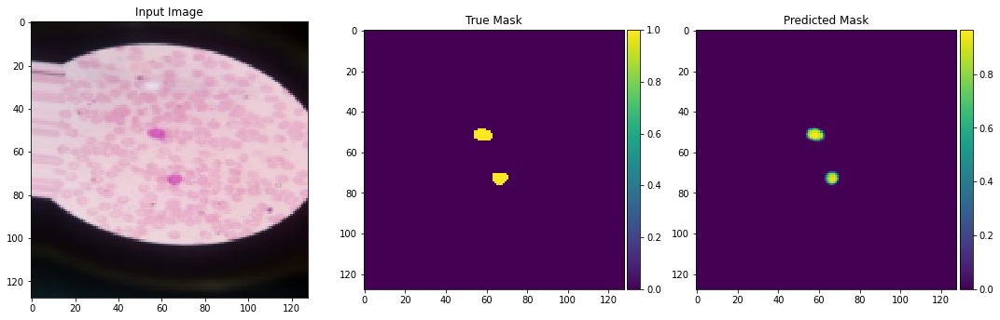


Sample Prediction after epoch 36

Epoch 37/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0035 - dice_coef: 0.7683 - binary_accuracy: 0.9987 - val_loss: 0.0029 - val_dice_coef: 0.8714 - val_binary_accuracy: 0.9990

Epoch 00037: val_dice_coef did not improve from 0.87610


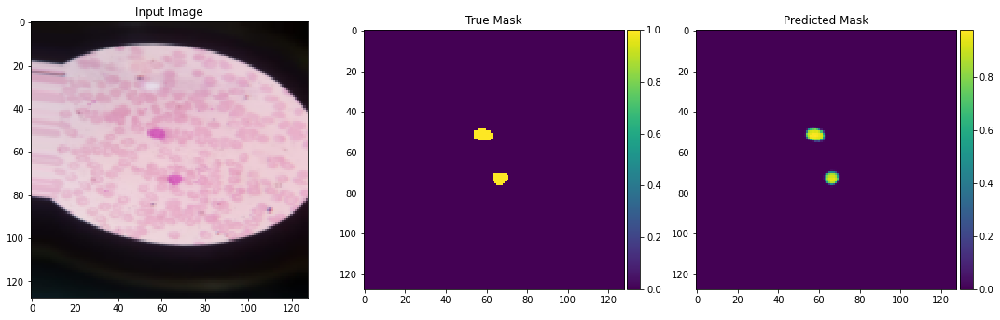


Sample Prediction after epoch 37

Epoch 38/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0033 - dice_coef: 0.7684 - binary_accuracy: 0.9987 - val_loss: 0.0032 - val_dice_coef: 0.8964 - val_binary_accuracy: 0.9990

Epoch 00038: val_dice_coef improved from 0.87610 to 0.89635, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


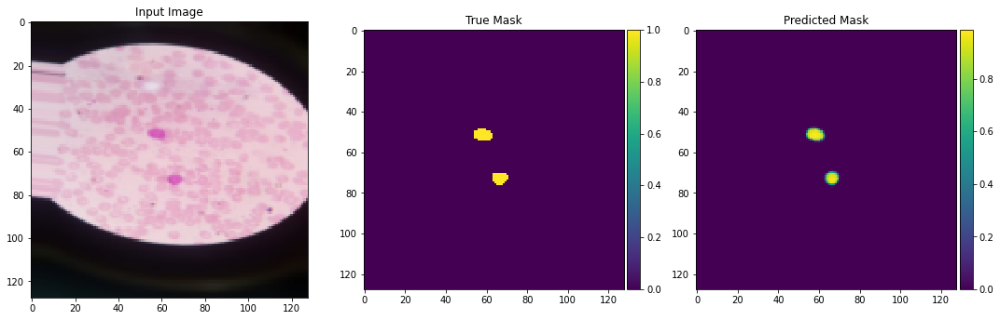


Sample Prediction after epoch 38

Epoch 39/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0034 - dice_coef: 0.7904 - binary_accuracy: 0.9987 - val_loss: 0.0029 - val_dice_coef: 0.8988 - val_binary_accuracy: 0.9990

Epoch 00039: val_dice_coef improved from 0.89635 to 0.89880, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


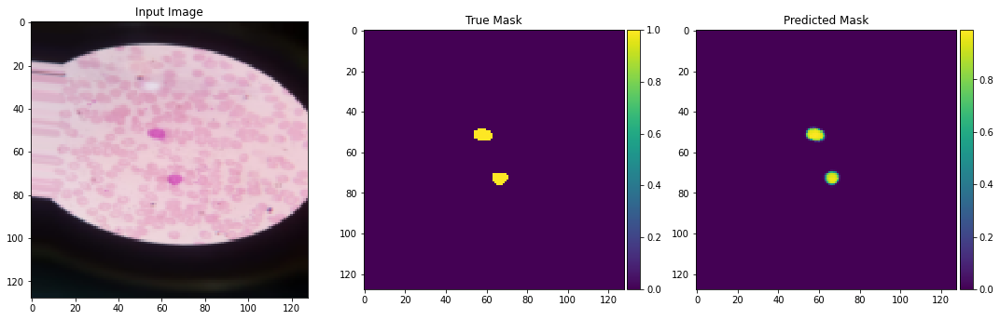


Sample Prediction after epoch 39

Epoch 40/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0032 - dice_coef: 0.7908 - binary_accuracy: 0.9988 - val_loss: 0.0027 - val_dice_coef: 0.8883 - val_binary_accuracy: 0.9990

Epoch 00040: val_dice_coef did not improve from 0.89880


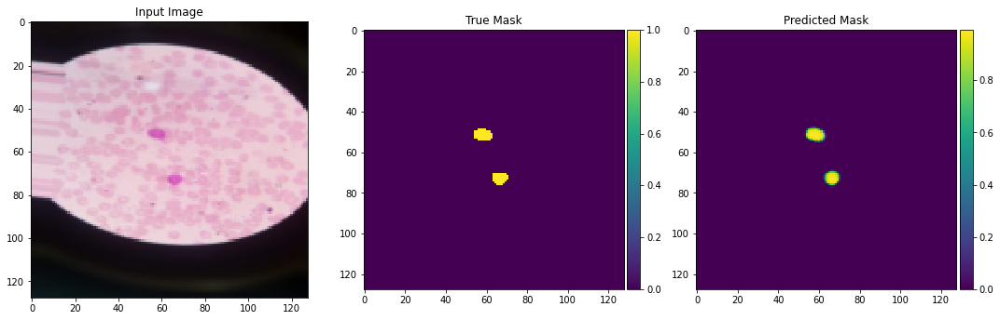


Sample Prediction after epoch 40

Epoch 41/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0031 - dice_coef: 0.7841 - binary_accuracy: 0.9989 - val_loss: 0.0025 - val_dice_coef: 0.8956 - val_binary_accuracy: 0.9991

Epoch 00041: val_dice_coef did not improve from 0.89880


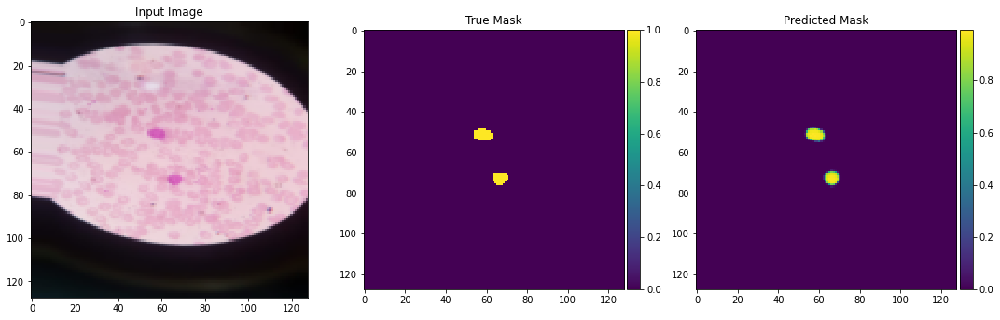


Sample Prediction after epoch 41

Epoch 42/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0030 - dice_coef: 0.7872 - binary_accuracy: 0.9989 - val_loss: 0.0026 - val_dice_coef: 0.9036 - val_binary_accuracy: 0.9990

Epoch 00042: val_dice_coef improved from 0.89880 to 0.90356, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


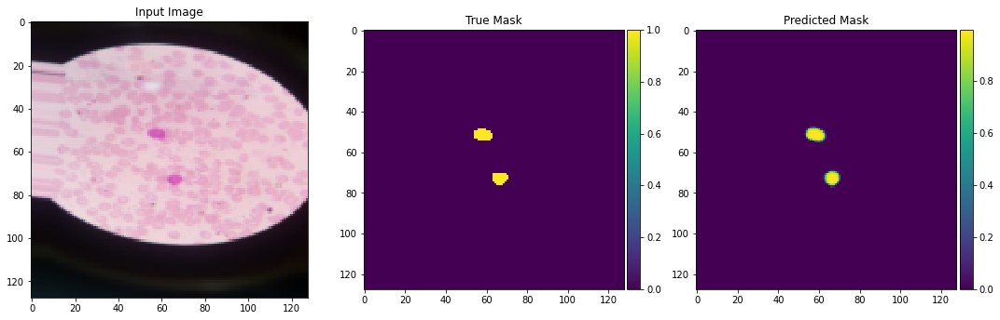


Sample Prediction after epoch 42

Epoch 43/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0032 - dice_coef: 0.7894 - binary_accuracy: 0.9988 - val_loss: 0.0027 - val_dice_coef: 0.9004 - val_binary_accuracy: 0.9990

Epoch 00043: val_dice_coef did not improve from 0.90356


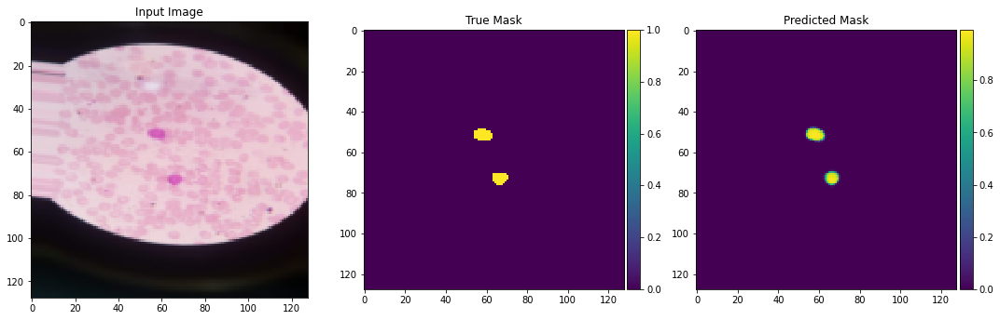


Sample Prediction after epoch 43

Epoch 44/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0031 - dice_coef: 0.7929 - binary_accuracy: 0.9988 - val_loss: 0.0028 - val_dice_coef: 0.9048 - val_binary_accuracy: 0.9991

Epoch 00044: val_dice_coef improved from 0.90356 to 0.90475, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


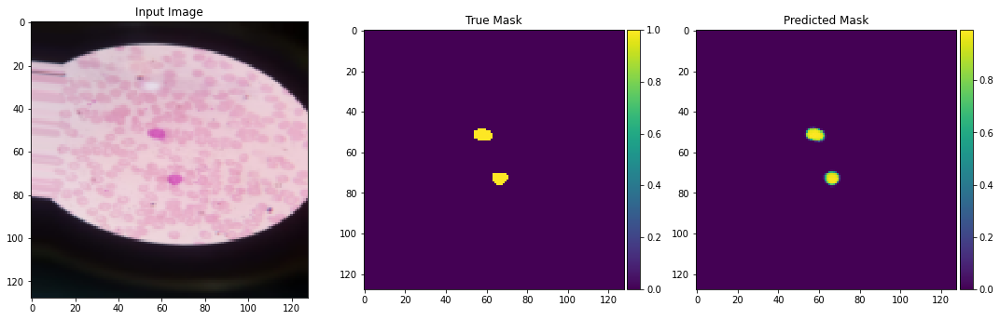


Sample Prediction after epoch 44

Epoch 45/500
28/28 [==============================] - 3s 95ms/step - loss: 0.0030 - dice_coef: 0.8092 - binary_accuracy: 0.9989 - val_loss: 0.0026 - val_dice_coef: 0.9029 - val_binary_accuracy: 0.9991

Epoch 00045: val_dice_coef did not improve from 0.90475


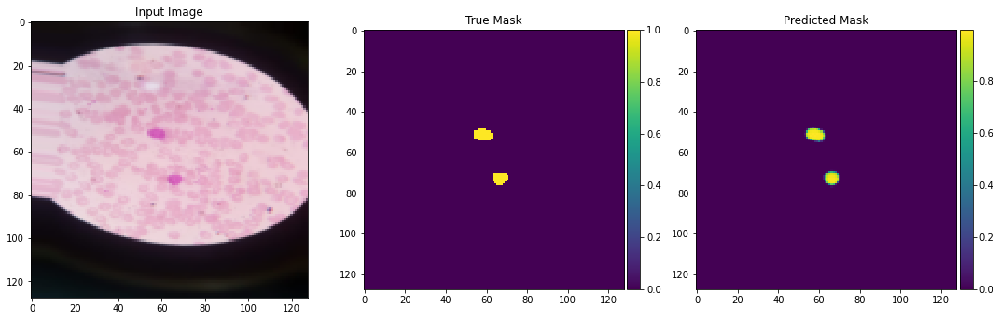


Sample Prediction after epoch 45

Epoch 46/500
28/28 [==============================] - 2s 90ms/step - loss: 0.0026 - dice_coef: 0.8357 - binary_accuracy: 0.9990 - val_loss: 0.0025 - val_dice_coef: 0.9172 - val_binary_accuracy: 0.9991

Epoch 00046: val_dice_coef improved from 0.90475 to 0.91720, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


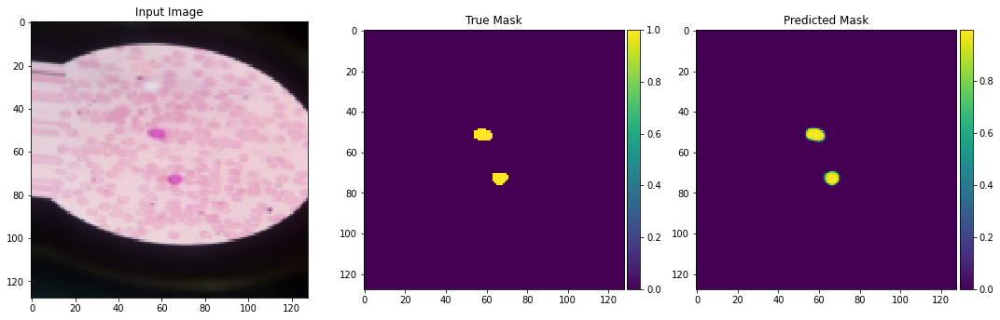


Sample Prediction after epoch 46

Epoch 47/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0028 - dice_coef: 0.8392 - binary_accuracy: 0.9990 - val_loss: 0.0023 - val_dice_coef: 0.8955 - val_binary_accuracy: 0.9991

Epoch 00047: val_dice_coef did not improve from 0.91720


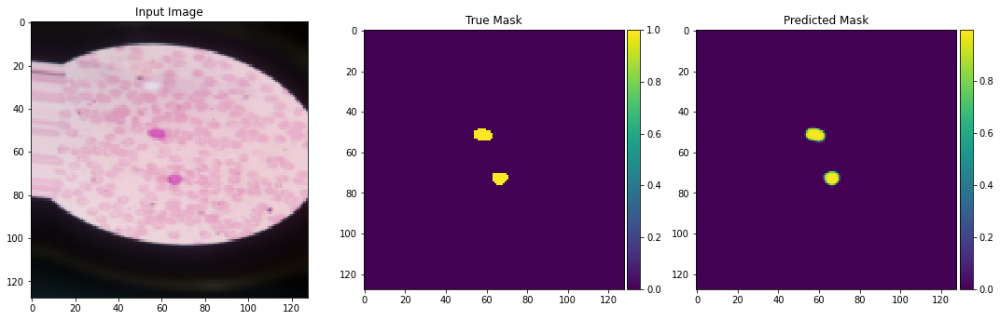


Sample Prediction after epoch 47

Epoch 48/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0027 - dice_coef: 0.8182 - binary_accuracy: 0.9990 - val_loss: 0.0027 - val_dice_coef: 0.9162 - val_binary_accuracy: 0.9991

Epoch 00048: val_dice_coef did not improve from 0.91720


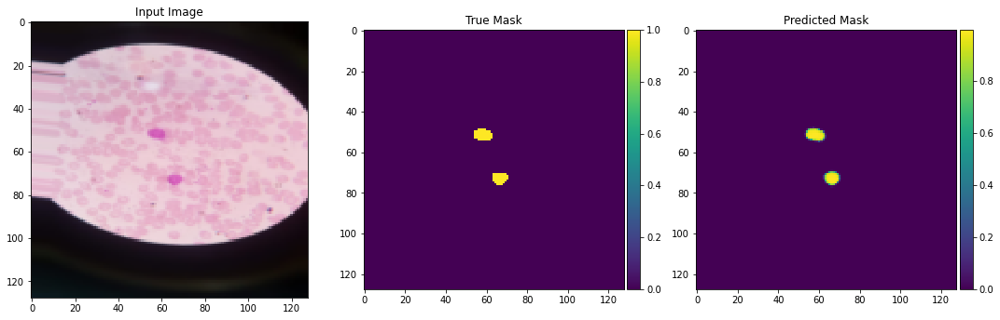


Sample Prediction after epoch 48

Epoch 49/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0027 - dice_coef: 0.8390 - binary_accuracy: 0.9989 - val_loss: 0.0024 - val_dice_coef: 0.8970 - val_binary_accuracy: 0.9991

Epoch 00049: val_dice_coef did not improve from 0.91720


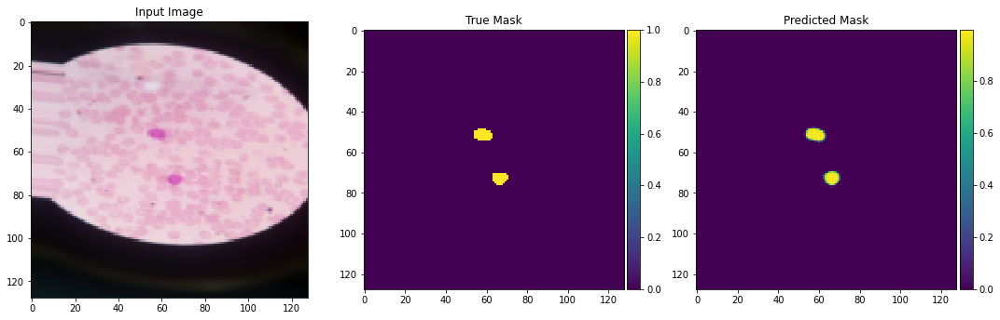


Sample Prediction after epoch 49

Epoch 50/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0025 - dice_coef: 0.8271 - binary_accuracy: 0.9990 - val_loss: 0.0024 - val_dice_coef: 0.9130 - val_binary_accuracy: 0.9991

Epoch 00050: val_dice_coef did not improve from 0.91720


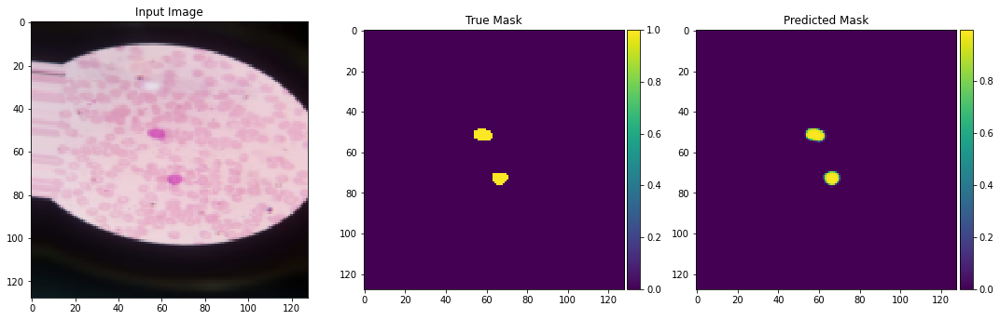


Sample Prediction after epoch 50

Epoch 51/500
28/28 [==============================] - 2s 90ms/step - loss: 0.0026 - dice_coef: 0.8518 - binary_accuracy: 0.9990 - val_loss: 0.0025 - val_dice_coef: 0.9180 - val_binary_accuracy: 0.9991

Epoch 00051: val_dice_coef improved from 0.91720 to 0.91800, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


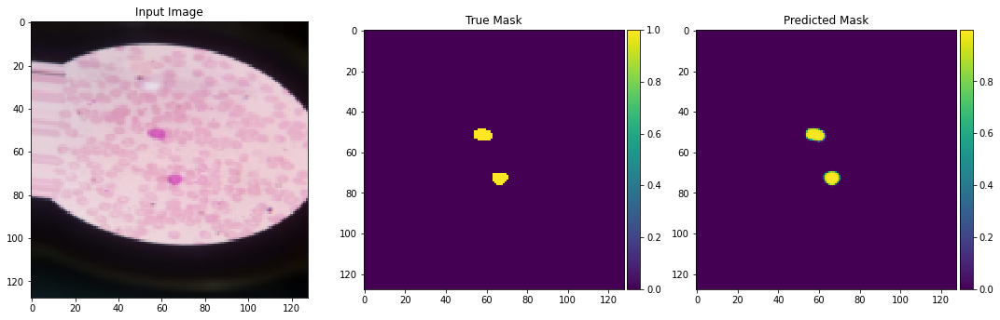


Sample Prediction after epoch 51

Epoch 52/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0025 - dice_coef: 0.8490 - binary_accuracy: 0.9991 - val_loss: 0.0024 - val_dice_coef: 0.8928 - val_binary_accuracy: 0.9992

Epoch 00052: val_dice_coef did not improve from 0.91800


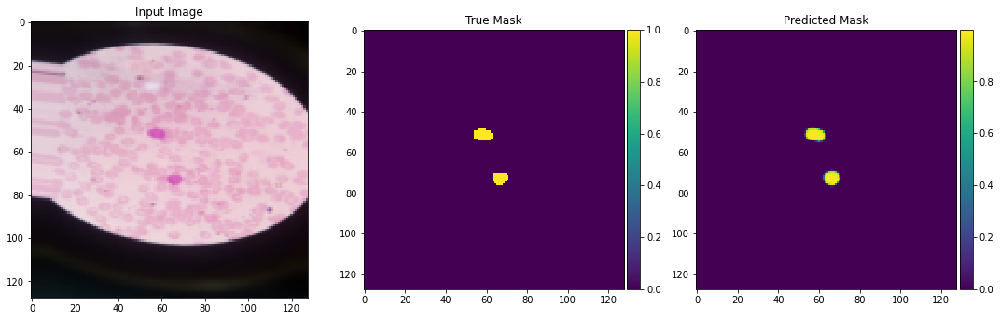


Sample Prediction after epoch 52

Epoch 53/500
28/28 [==============================] - 2s 89ms/step - loss: 0.0023 - dice_coef: 0.8299 - binary_accuracy: 0.9991 - val_loss: 0.0024 - val_dice_coef: 0.9043 - val_binary_accuracy: 0.9992

Epoch 00053: val_dice_coef did not improve from 0.91800


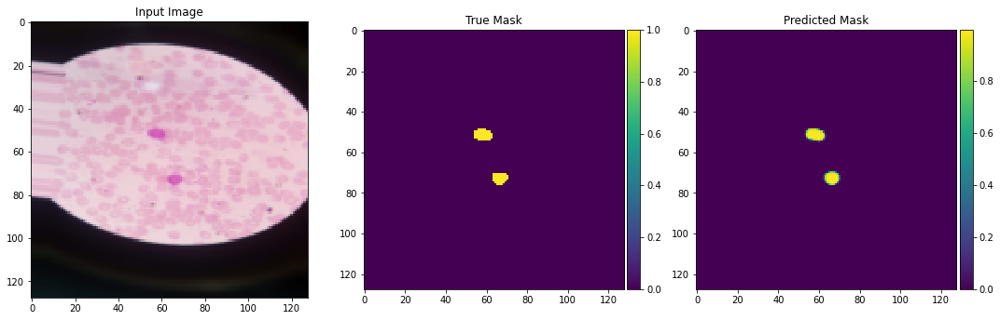


Sample Prediction after epoch 53

Epoch 54/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0026 - dice_coef: 0.8587 - binary_accuracy: 0.9990 - val_loss: 0.0025 - val_dice_coef: 0.9082 - val_binary_accuracy: 0.9992

Epoch 00054: val_dice_coef did not improve from 0.91800


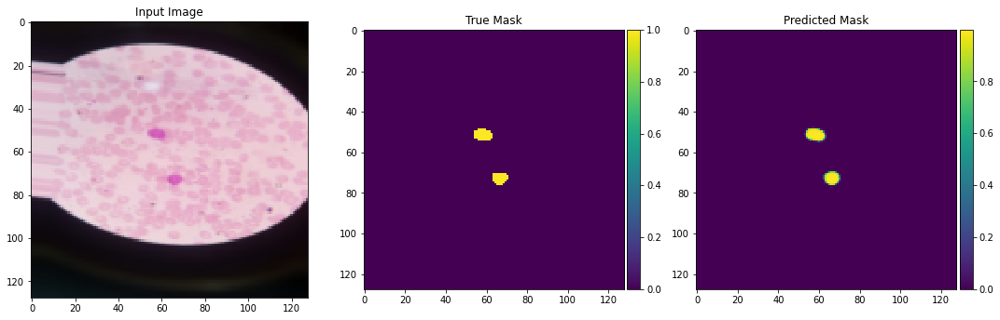


Sample Prediction after epoch 54

Epoch 55/500
28/28 [==============================] - 2s 90ms/step - loss: 0.0025 - dice_coef: 0.8481 - binary_accuracy: 0.9990 - val_loss: 0.0028 - val_dice_coef: 0.8953 - val_binary_accuracy: 0.9990

Epoch 00055: val_dice_coef did not improve from 0.91800


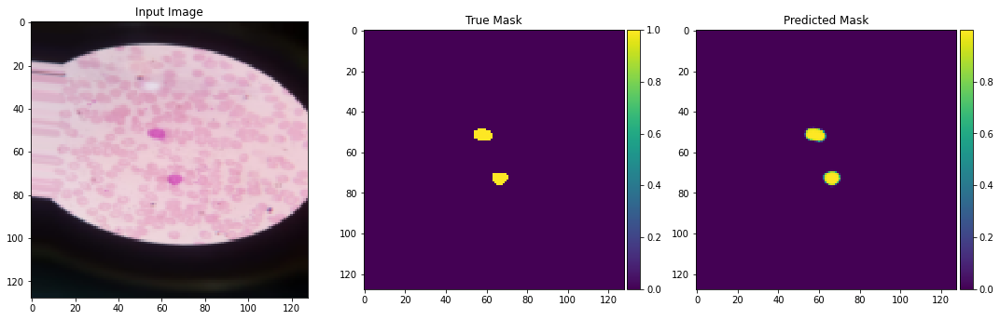


Sample Prediction after epoch 55

Epoch 56/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0025 - dice_coef: 0.8502 - binary_accuracy: 0.9990 - val_loss: 0.0025 - val_dice_coef: 0.8943 - val_binary_accuracy: 0.9991

Epoch 00056: val_dice_coef did not improve from 0.91800


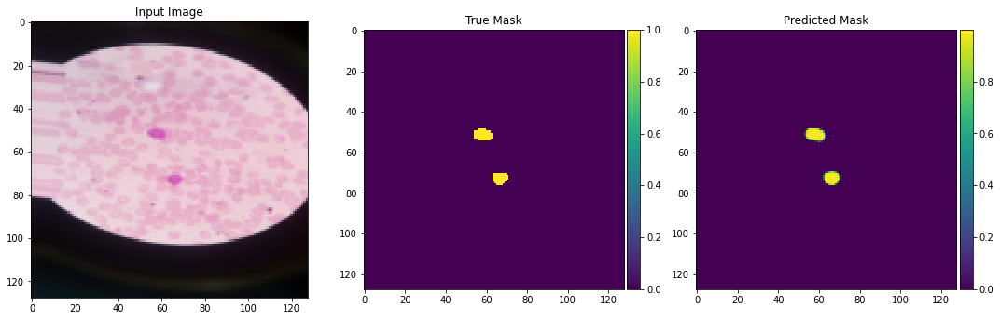


Sample Prediction after epoch 56

Epoch 57/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0025 - dice_coef: 0.8543 - binary_accuracy: 0.9990 - val_loss: 0.0025 - val_dice_coef: 0.9144 - val_binary_accuracy: 0.9991

Epoch 00057: val_dice_coef did not improve from 0.91800


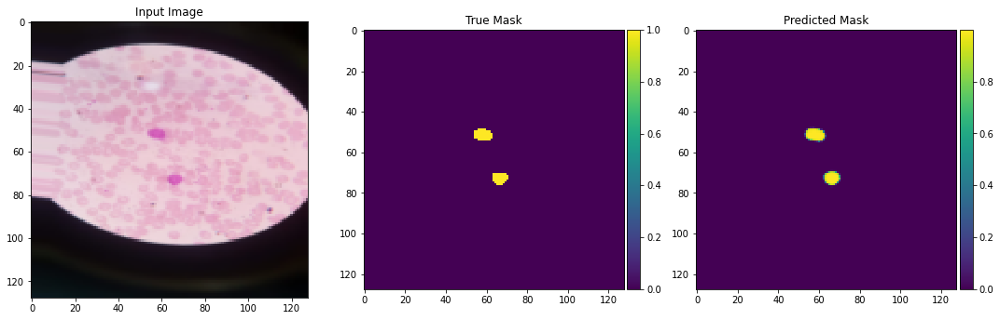


Sample Prediction after epoch 57

Epoch 58/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0023 - dice_coef: 0.8703 - binary_accuracy: 0.9991 - val_loss: 0.0025 - val_dice_coef: 0.9102 - val_binary_accuracy: 0.9991

Epoch 00058: val_dice_coef did not improve from 0.91800


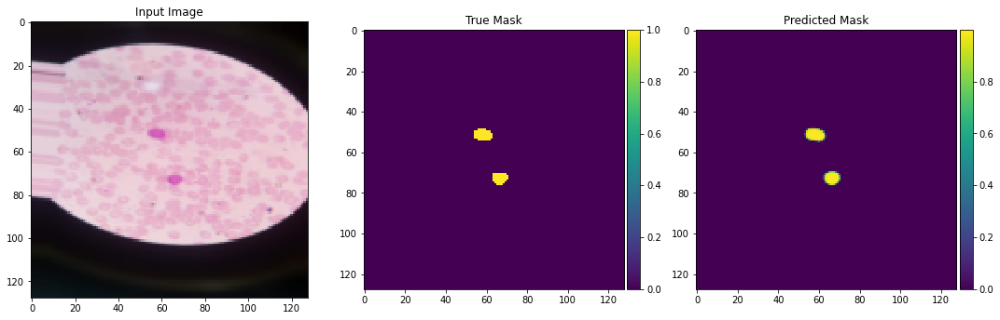


Sample Prediction after epoch 58

Epoch 59/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0021 - dice_coef: 0.8744 - binary_accuracy: 0.9992 - val_loss: 0.0025 - val_dice_coef: 0.9180 - val_binary_accuracy: 0.9991

Epoch 00059: val_dice_coef improved from 0.91800 to 0.91804, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


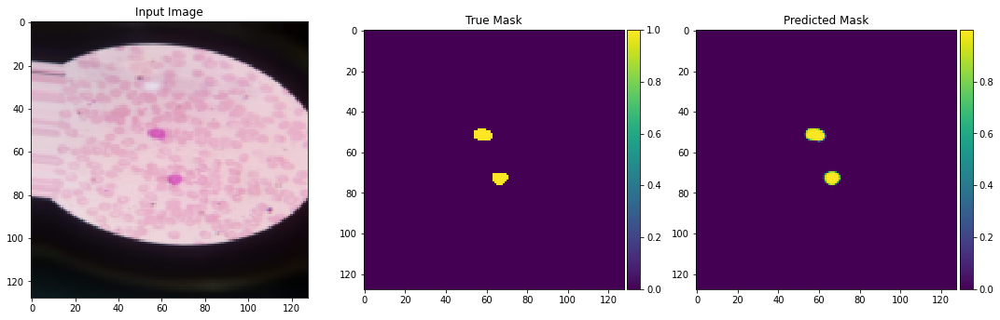


Sample Prediction after epoch 59

Epoch 60/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0021 - dice_coef: 0.8808 - binary_accuracy: 0.9992 - val_loss: 0.0025 - val_dice_coef: 0.9213 - val_binary_accuracy: 0.9992

Epoch 00060: val_dice_coef improved from 0.91804 to 0.92128, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


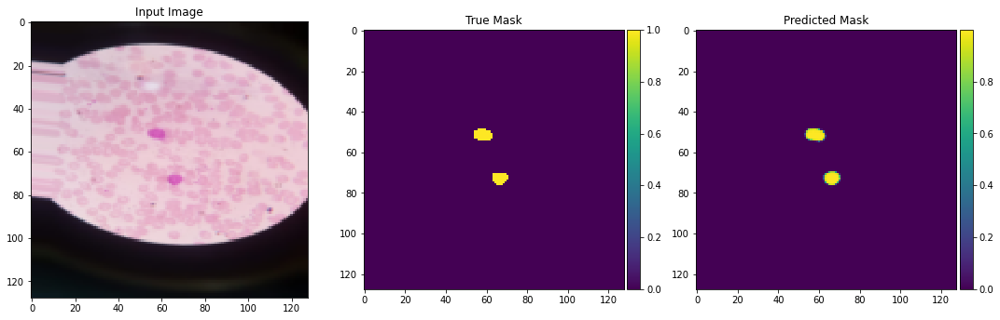


Sample Prediction after epoch 60

Epoch 61/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0020 - dice_coef: 0.8718 - binary_accuracy: 0.9992 - val_loss: 0.0027 - val_dice_coef: 0.8903 - val_binary_accuracy: 0.9991

Epoch 00061: val_dice_coef did not improve from 0.92128


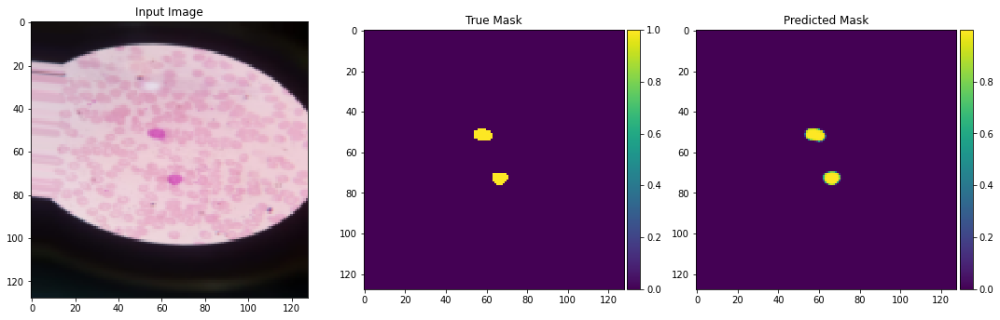


Sample Prediction after epoch 61

Epoch 62/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0019 - dice_coef: 0.8799 - binary_accuracy: 0.9992 - val_loss: 0.0024 - val_dice_coef: 0.9186 - val_binary_accuracy: 0.9992

Epoch 00062: val_dice_coef did not improve from 0.92128


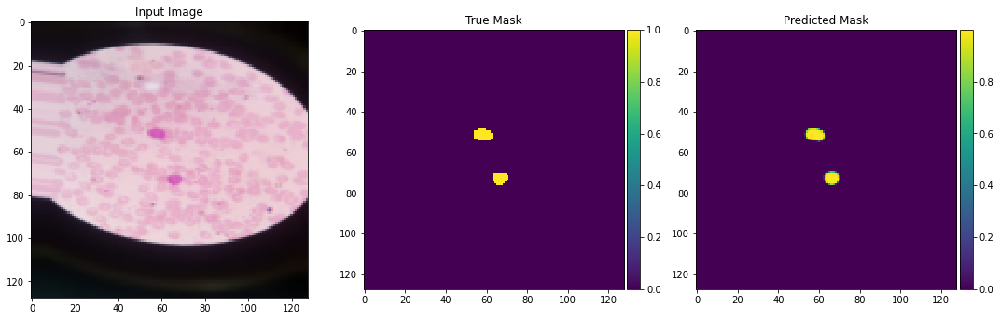


Sample Prediction after epoch 62

Epoch 63/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0019 - dice_coef: 0.8844 - binary_accuracy: 0.9993 - val_loss: 0.0026 - val_dice_coef: 0.9072 - val_binary_accuracy: 0.9991

Epoch 00063: val_dice_coef did not improve from 0.92128


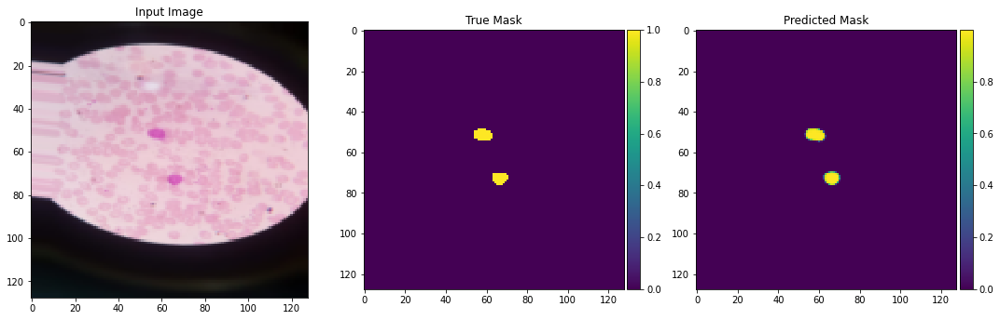


Sample Prediction after epoch 63

Epoch 64/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0018 - dice_coef: 0.8783 - binary_accuracy: 0.9993 - val_loss: 0.0026 - val_dice_coef: 0.9214 - val_binary_accuracy: 0.9991

Epoch 00064: val_dice_coef improved from 0.92128 to 0.92135, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


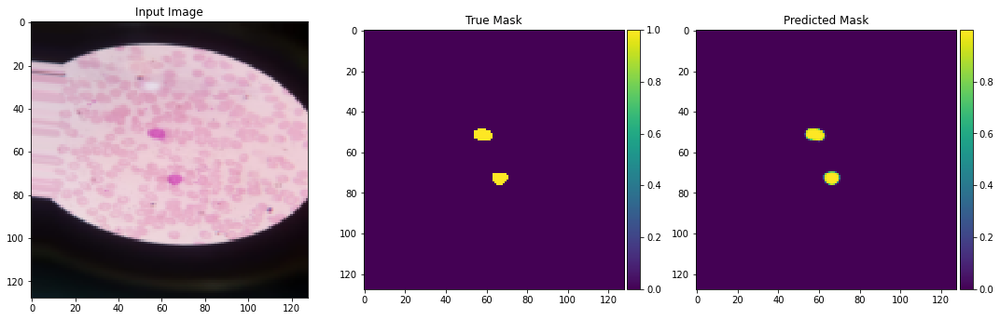


Sample Prediction after epoch 64

Epoch 65/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0017 - dice_coef: 0.8972 - binary_accuracy: 0.9993 - val_loss: 0.0027 - val_dice_coef: 0.9165 - val_binary_accuracy: 0.9991

Epoch 00065: val_dice_coef did not improve from 0.92135


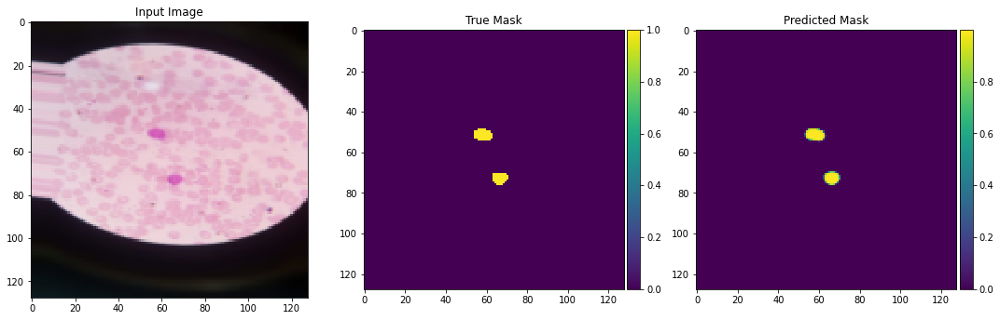


Sample Prediction after epoch 65

Epoch 66/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0019 - dice_coef: 0.8991 - binary_accuracy: 0.9992 - val_loss: 0.0027 - val_dice_coef: 0.9177 - val_binary_accuracy: 0.9991

Epoch 00066: val_dice_coef did not improve from 0.92135


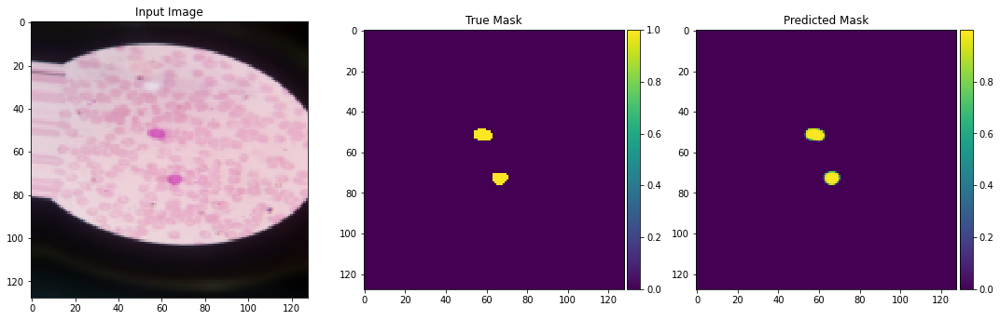


Sample Prediction after epoch 66

Epoch 67/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0017 - dice_coef: 0.9022 - binary_accuracy: 0.9993 - val_loss: 0.0027 - val_dice_coef: 0.9120 - val_binary_accuracy: 0.9991

Epoch 00067: val_dice_coef did not improve from 0.92135


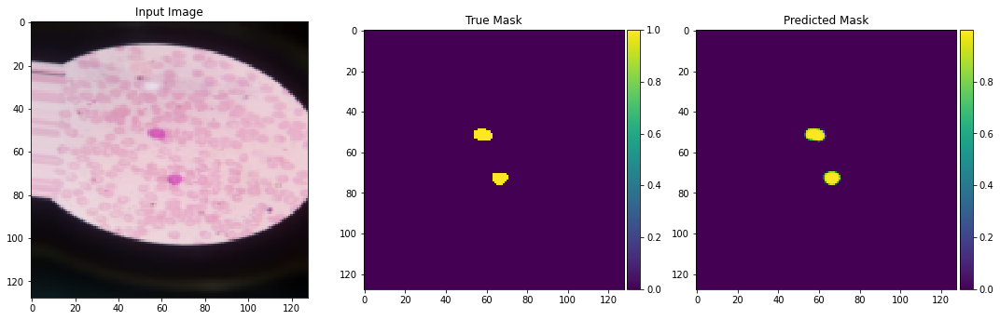


Sample Prediction after epoch 67

Epoch 68/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0017 - dice_coef: 0.8953 - binary_accuracy: 0.9993 - val_loss: 0.0026 - val_dice_coef: 0.9069 - val_binary_accuracy: 0.9991

Epoch 00068: val_dice_coef did not improve from 0.92135


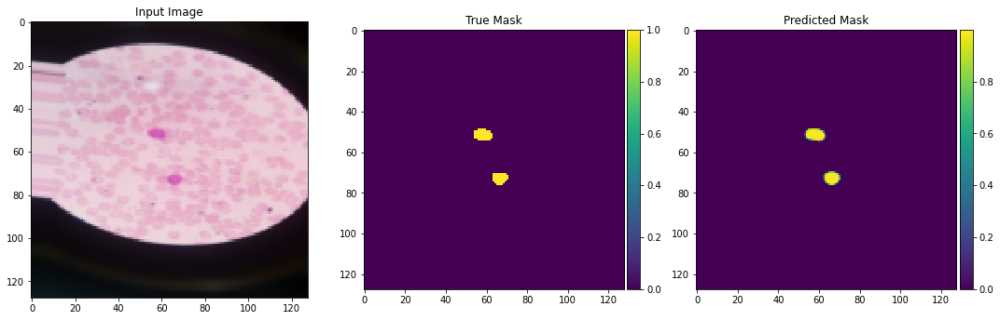


Sample Prediction after epoch 68

Epoch 69/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0016 - dice_coef: 0.9021 - binary_accuracy: 0.9994 - val_loss: 0.0026 - val_dice_coef: 0.9293 - val_binary_accuracy: 0.9992

Epoch 00069: val_dice_coef improved from 0.92135 to 0.92929, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


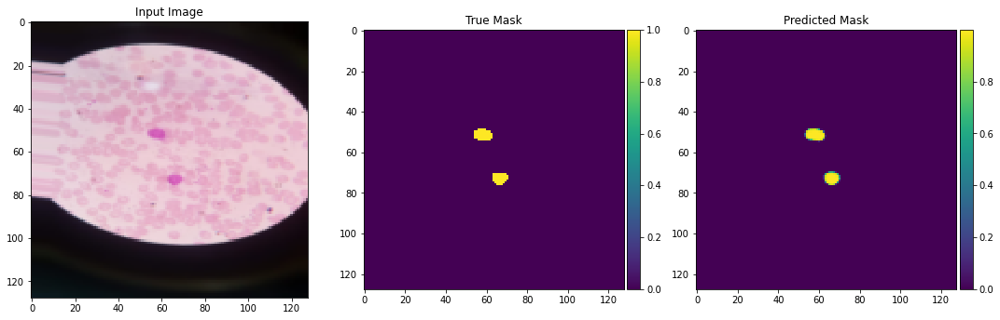


Sample Prediction after epoch 69

Epoch 70/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0016 - dice_coef: 0.9124 - binary_accuracy: 0.9993 - val_loss: 0.0025 - val_dice_coef: 0.9127 - val_binary_accuracy: 0.9992

Epoch 00070: val_dice_coef did not improve from 0.92929


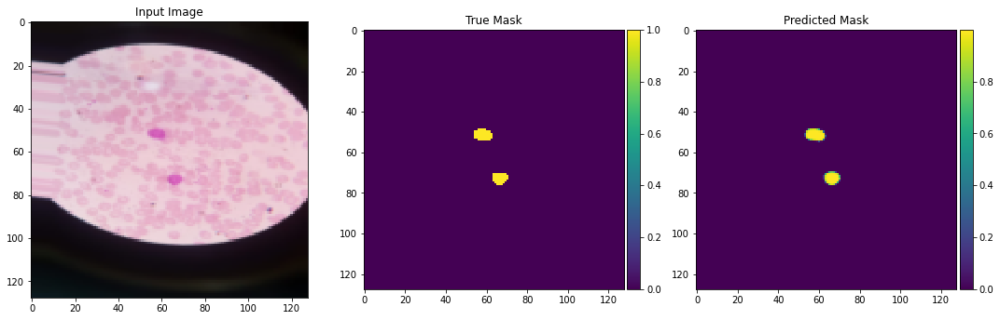


Sample Prediction after epoch 70

Epoch 71/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0015 - dice_coef: 0.9086 - binary_accuracy: 0.9994 - val_loss: 0.0027 - val_dice_coef: 0.9041 - val_binary_accuracy: 0.9991

Epoch 00071: val_dice_coef did not improve from 0.92929


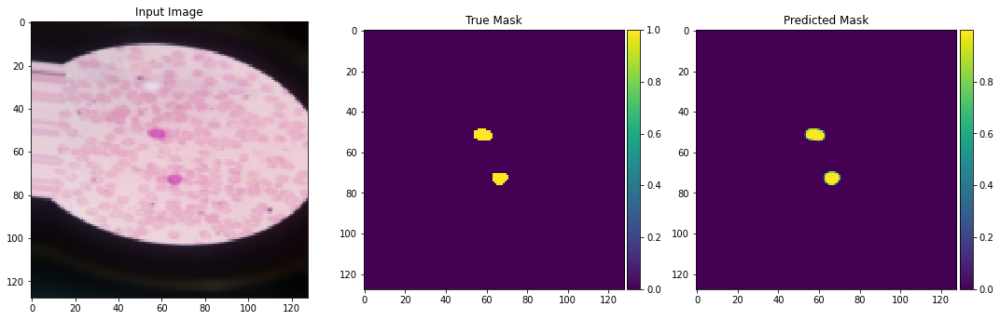


Sample Prediction after epoch 71

Epoch 72/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0015 - dice_coef: 0.9159 - binary_accuracy: 0.9994 - val_loss: 0.0027 - val_dice_coef: 0.9337 - val_binary_accuracy: 0.9992

Epoch 00072: val_dice_coef improved from 0.92929 to 0.93366, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


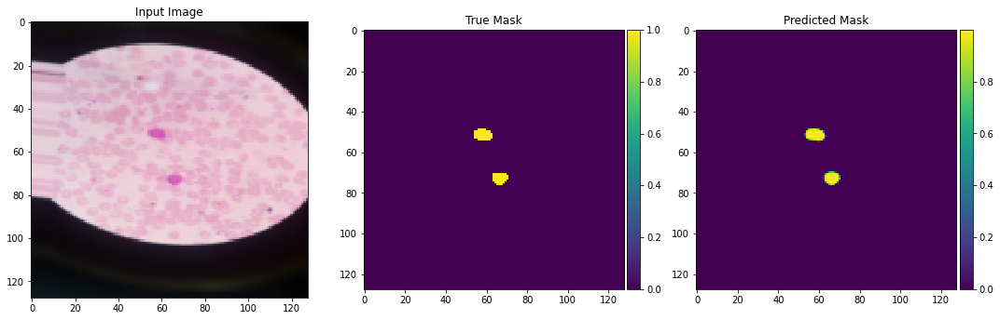


Sample Prediction after epoch 72

Epoch 73/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0017 - dice_coef: 0.9068 - binary_accuracy: 0.9993 - val_loss: 0.0026 - val_dice_coef: 0.9146 - val_binary_accuracy: 0.9991

Epoch 00073: val_dice_coef did not improve from 0.93366


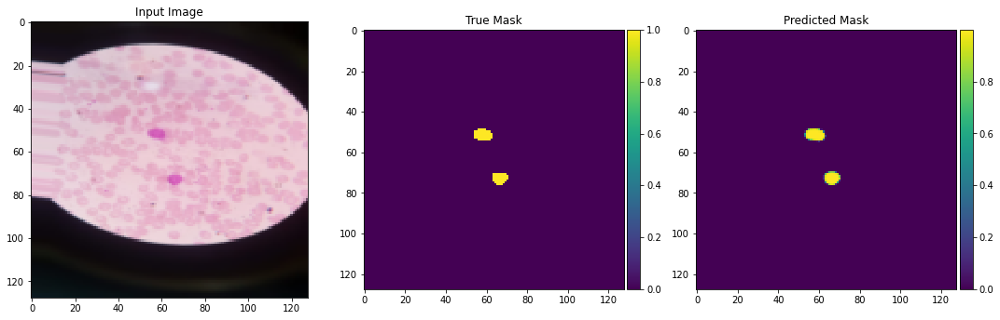


Sample Prediction after epoch 73

Epoch 74/500
28/28 [==============================] - 3s 90ms/step - loss: 0.0017 - dice_coef: 0.9116 - binary_accuracy: 0.9993 - val_loss: 0.0030 - val_dice_coef: 0.9098 - val_binary_accuracy: 0.9991

Epoch 00074: val_dice_coef did not improve from 0.93366


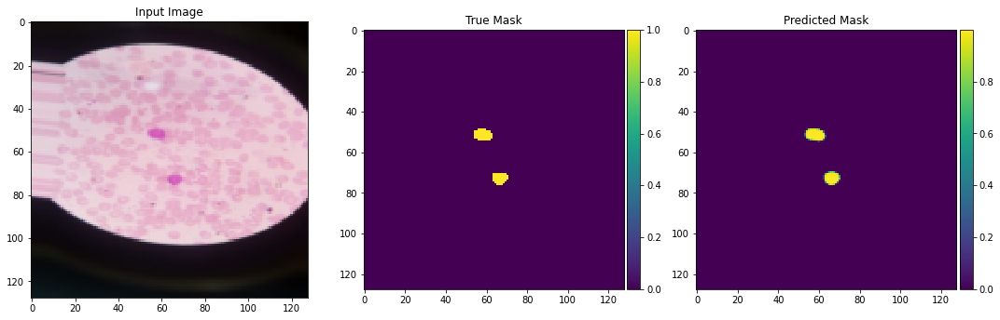


Sample Prediction after epoch 74

Epoch 75/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0015 - dice_coef: 0.9095 - binary_accuracy: 0.9994 - val_loss: 0.0029 - val_dice_coef: 0.9075 - val_binary_accuracy: 0.9991

Epoch 00075: val_dice_coef did not improve from 0.93366


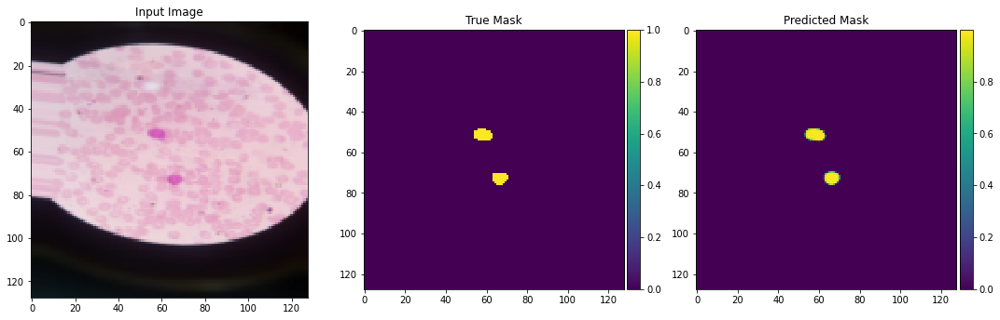


Sample Prediction after epoch 75

Epoch 76/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0016 - dice_coef: 0.8904 - binary_accuracy: 0.9993 - val_loss: 0.0027 - val_dice_coef: 0.8878 - val_binary_accuracy: 0.9991

Epoch 00076: val_dice_coef did not improve from 0.93366


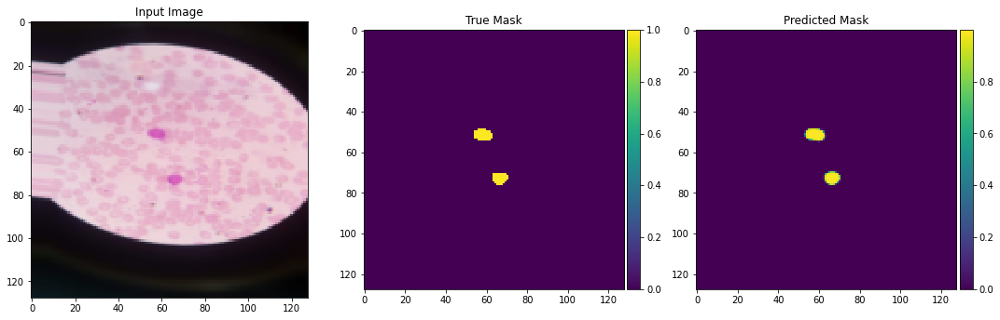


Sample Prediction after epoch 76

Epoch 77/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0015 - dice_coef: 0.9105 - binary_accuracy: 0.9994 - val_loss: 0.0027 - val_dice_coef: 0.9275 - val_binary_accuracy: 0.9992

Epoch 00077: val_dice_coef did not improve from 0.93366


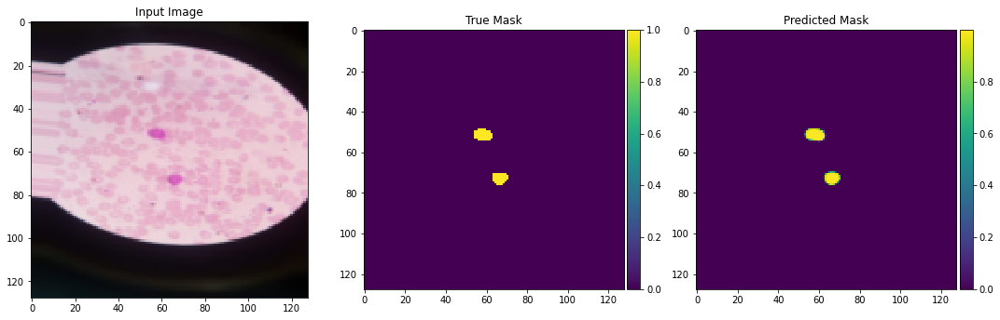


Sample Prediction after epoch 77

Epoch 78/500
28/28 [==============================] - 3s 91ms/step - loss: 0.0014 - dice_coef: 0.9231 - binary_accuracy: 0.9994 - val_loss: 0.0027 - val_dice_coef: 0.9172 - val_binary_accuracy: 0.9992

Epoch 00078: val_dice_coef did not improve from 0.93366


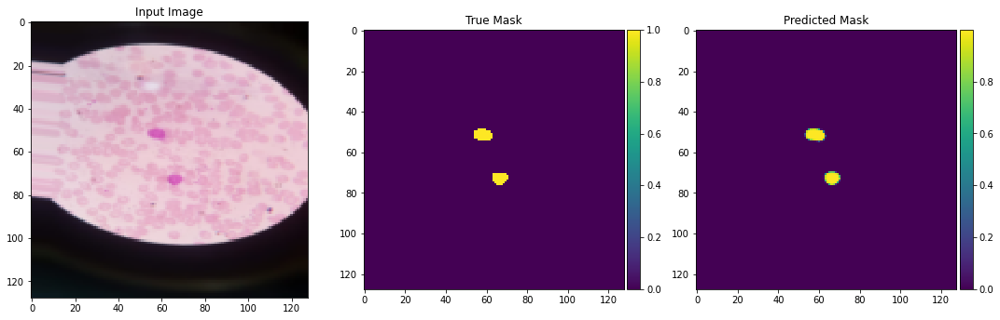


Sample Prediction after epoch 78

Epoch 79/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0013 - dice_coef: 0.9267 - binary_accuracy: 0.9994 - val_loss: 0.0027 - val_dice_coef: 0.9319 - val_binary_accuracy: 0.9992

Epoch 00079: val_dice_coef did not improve from 0.93366


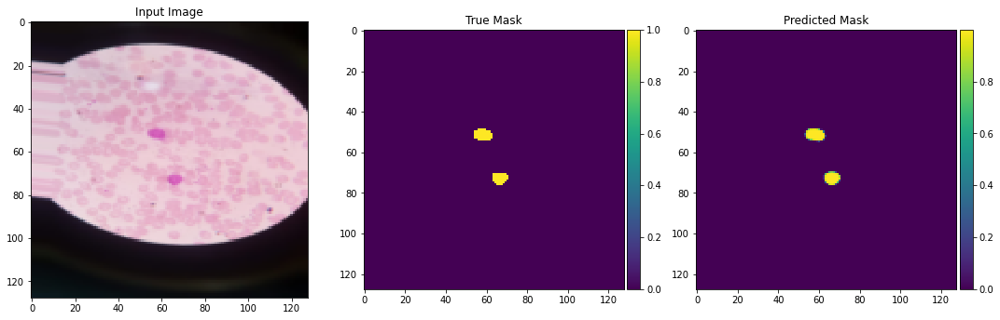


Sample Prediction after epoch 79

Epoch 80/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0014 - dice_coef: 0.9306 - binary_accuracy: 0.9994 - val_loss: 0.0027 - val_dice_coef: 0.9309 - val_binary_accuracy: 0.9992

Epoch 00080: val_dice_coef did not improve from 0.93366


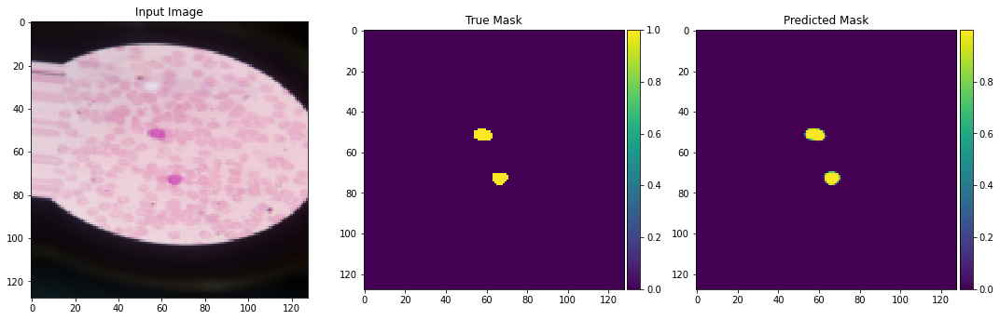


Sample Prediction after epoch 80

Epoch 81/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0014 - dice_coef: 0.9308 - binary_accuracy: 0.9994 - val_loss: 0.0031 - val_dice_coef: 0.9381 - val_binary_accuracy: 0.9991

Epoch 00081: val_dice_coef improved from 0.93366 to 0.93807, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


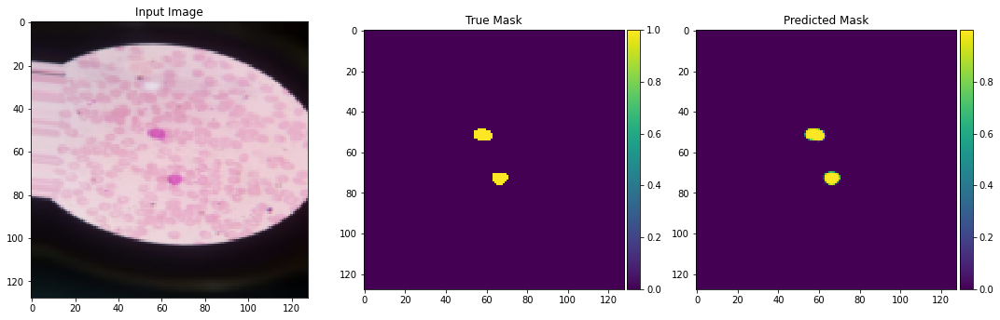


Sample Prediction after epoch 81

Epoch 82/500
28/28 [==============================] - 3s 93ms/step - loss: 0.0014 - dice_coef: 0.9293 - binary_accuracy: 0.9994 - val_loss: 0.0029 - val_dice_coef: 0.9230 - val_binary_accuracy: 0.9991

Epoch 00082: val_dice_coef did not improve from 0.93807


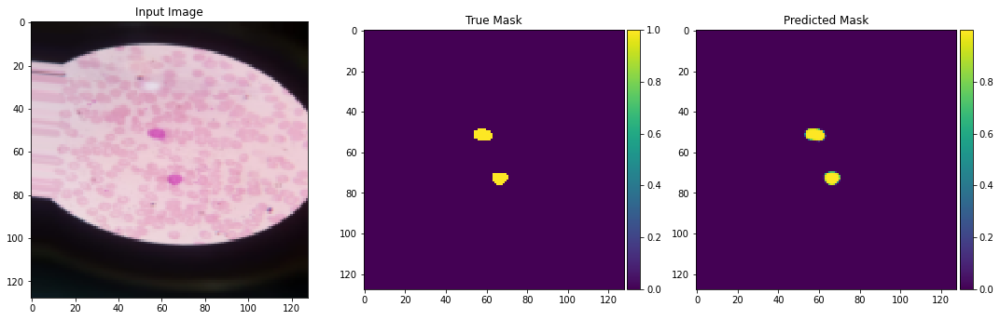


Sample Prediction after epoch 82

Epoch 83/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0014 - dice_coef: 0.9329 - binary_accuracy: 0.9994 - val_loss: 0.0031 - val_dice_coef: 0.9328 - val_binary_accuracy: 0.9991

Epoch 00083: val_dice_coef did not improve from 0.93807


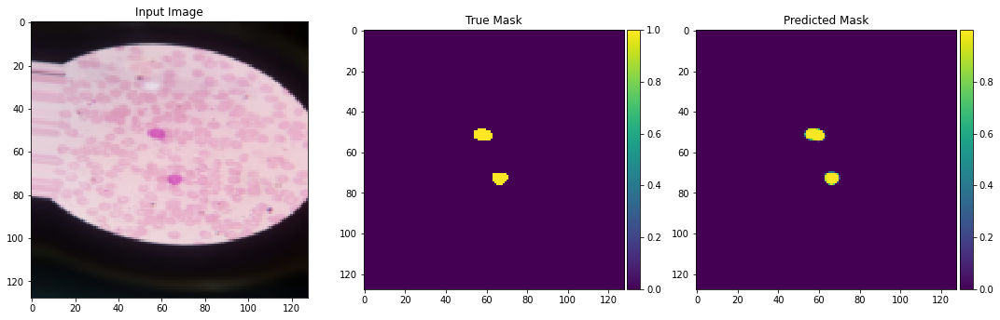


Sample Prediction after epoch 83

Epoch 84/500
28/28 [==============================] - 3s 93ms/step - loss: 0.0014 - dice_coef: 0.9242 - binary_accuracy: 0.9994 - val_loss: 0.0030 - val_dice_coef: 0.9309 - val_binary_accuracy: 0.9991

Epoch 00084: val_dice_coef did not improve from 0.93807


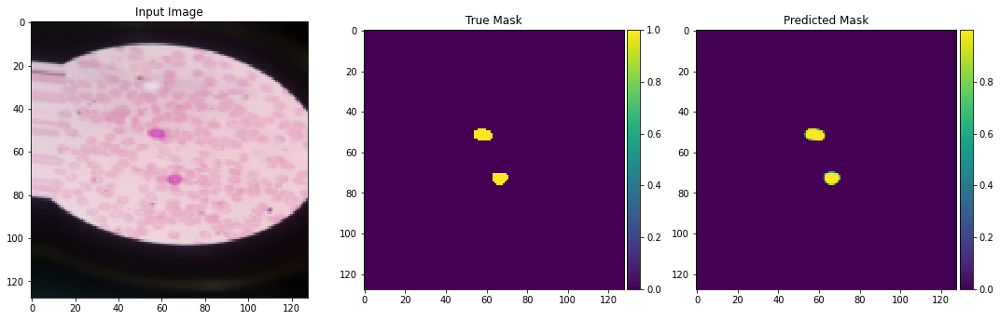


Sample Prediction after epoch 84

Epoch 85/500
28/28 [==============================] - 3s 94ms/step - loss: 0.0014 - dice_coef: 0.9240 - binary_accuracy: 0.9994 - val_loss: 0.0030 - val_dice_coef: 0.9310 - val_binary_accuracy: 0.9991

Epoch 00085: val_dice_coef did not improve from 0.93807


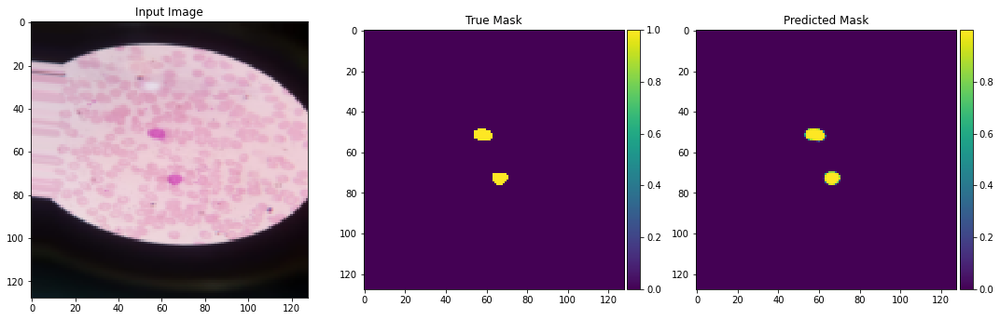


Sample Prediction after epoch 85

Epoch 86/500
28/28 [==============================] - 3s 93ms/step - loss: 0.0013 - dice_coef: 0.9359 - binary_accuracy: 0.9994 - val_loss: 0.0029 - val_dice_coef: 0.9327 - val_binary_accuracy: 0.9992

Epoch 00086: val_dice_coef did not improve from 0.93807


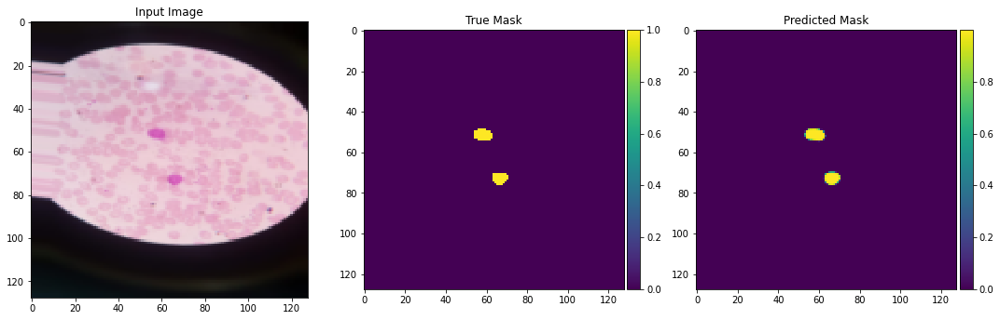


Sample Prediction after epoch 86

Epoch 87/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0012 - dice_coef: 0.9339 - binary_accuracy: 0.9995 - val_loss: 0.0030 - val_dice_coef: 0.9350 - val_binary_accuracy: 0.9991

Epoch 00087: val_dice_coef did not improve from 0.93807


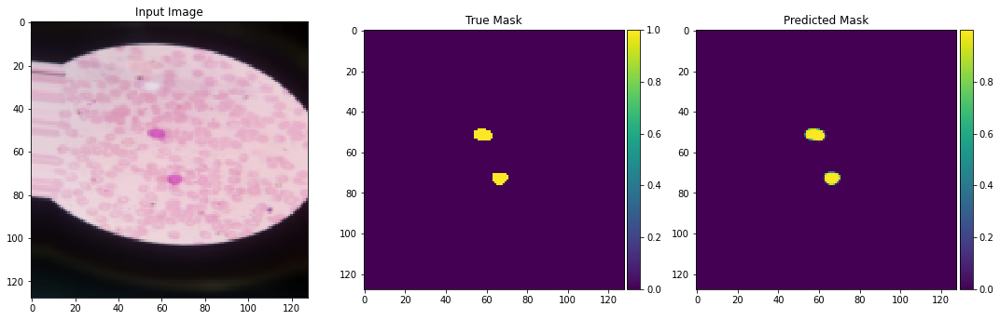


Sample Prediction after epoch 87

Epoch 88/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0012 - dice_coef: 0.9357 - binary_accuracy: 0.9995 - val_loss: 0.0030 - val_dice_coef: 0.9360 - val_binary_accuracy: 0.9991

Epoch 00088: val_dice_coef did not improve from 0.93807


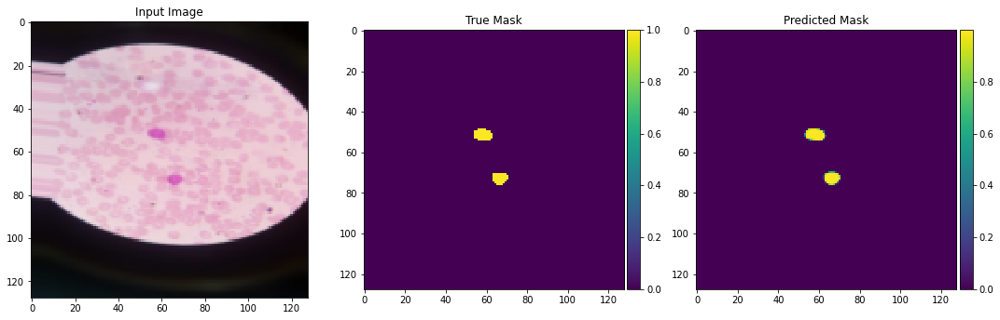


Sample Prediction after epoch 88

Epoch 89/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0012 - dice_coef: 0.9379 - binary_accuracy: 0.9995 - val_loss: 0.0030 - val_dice_coef: 0.9286 - val_binary_accuracy: 0.9992

Epoch 00089: val_dice_coef did not improve from 0.93807


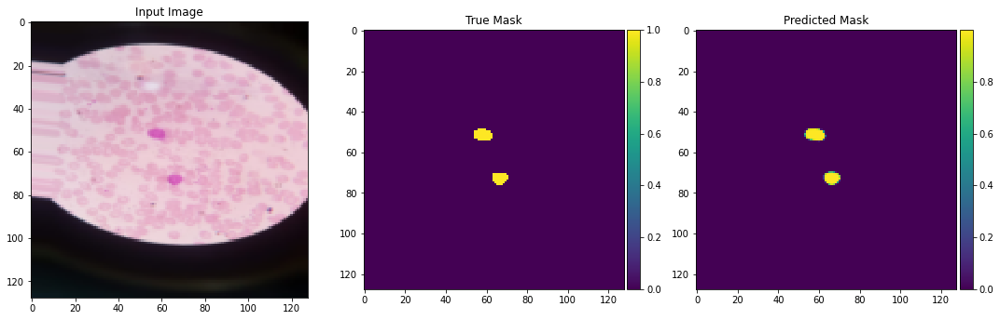


Sample Prediction after epoch 89

Epoch 90/500
28/28 [==============================] - 3s 92ms/step - loss: 0.0012 - dice_coef: 0.9410 - binary_accuracy: 0.9995 - val_loss: 0.0031 - val_dice_coef: 0.9401 - val_binary_accuracy: 0.9992

Epoch 00090: val_dice_coef improved from 0.93807 to 0.94009, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


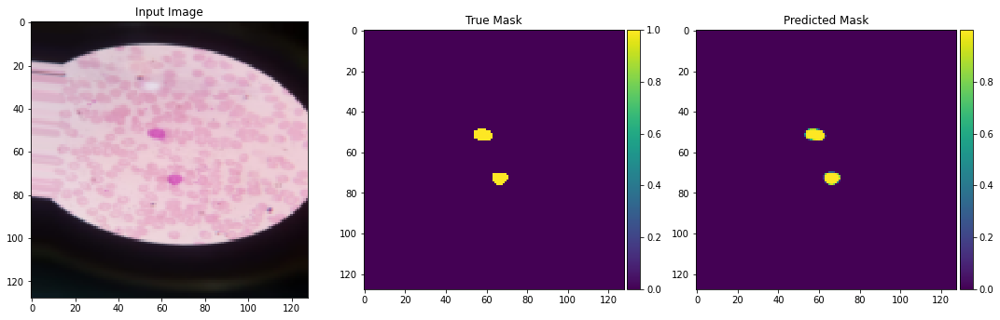


Sample Prediction after epoch 90

Epoch 91/500
28/28 [==============================] - 3s 93ms/step - loss: 0.0012 - dice_coef: 0.9399 - binary_accuracy: 0.9995 - val_loss: 0.0030 - val_dice_coef: 0.9344 - val_binary_accuracy: 0.9992

Epoch 00091: val_dice_coef did not improve from 0.94009


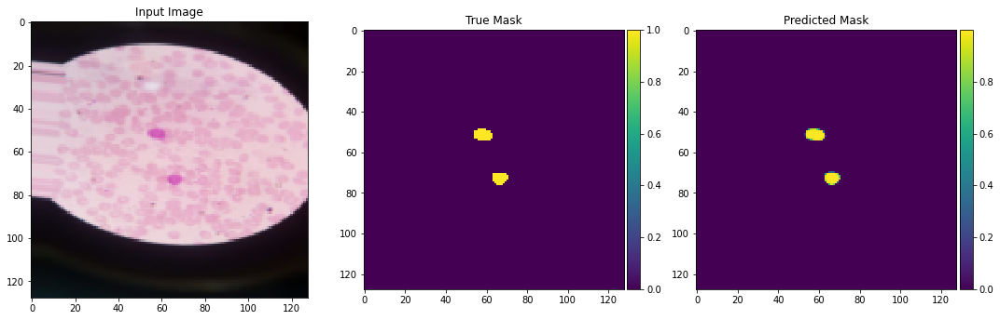


Sample Prediction after epoch 91

Epoch 92/500
28/28 [==============================] - 3s 94ms/step - loss: 0.0011 - dice_coef: 0.9405 - binary_accuracy: 0.9995 - val_loss: 0.0030 - val_dice_coef: 0.9414 - val_binary_accuracy: 0.9992

Epoch 00092: val_dice_coef improved from 0.94009 to 0.94136, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/segmentation/model/segmentation_model.h5


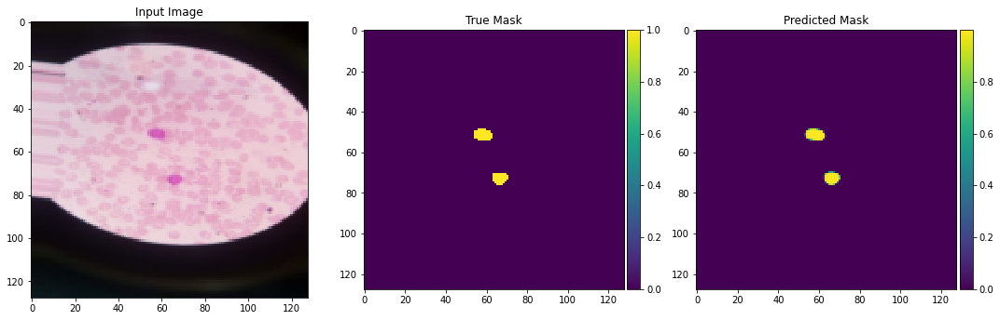


Sample Prediction after epoch 92

Epoch 93/500
28/28 [==============================] - 3s 94ms/step - loss: 0.0012 - dice_coef: 0.9398 - binary_accuracy: 0.9995 - val_loss: 0.0030 - val_dice_coef: 0.9369 - val_binary_accuracy: 0.9992

Epoch 00093: val_dice_coef did not improve from 0.94136


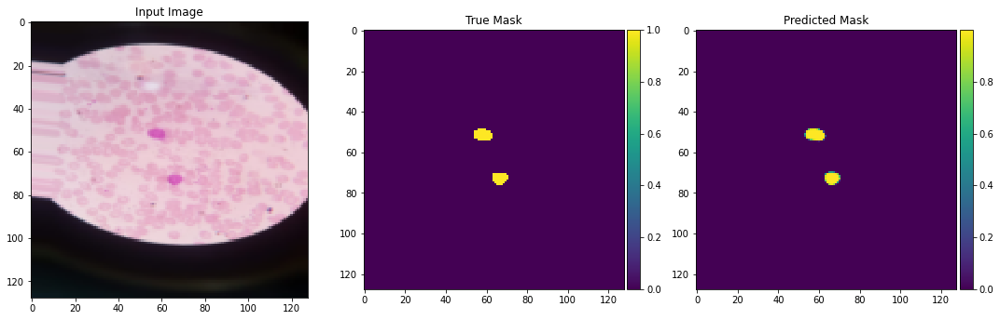


Sample Prediction after epoch 93

Epoch 94/500
28/28 [==============================] - 3s 93ms/step - loss: 0.0011 - dice_coef: 0.9429 - binary_accuracy: 0.9995 - val_loss: 0.0032 - val_dice_coef: 0.9399 - val_binary_accuracy: 0.9991

Epoch 00094: val_dice_coef did not improve from 0.94136


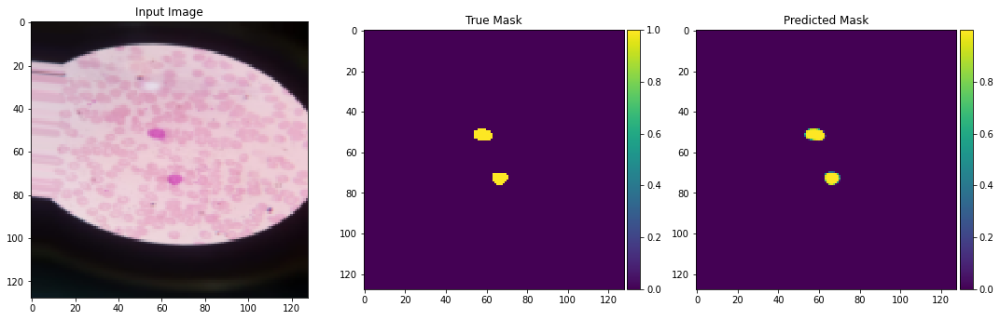


Sample Prediction after epoch 94

Epoch 95/500
28/28 [==============================] - 3s 94ms/step - loss: 0.0011 - dice_coef: 0.9405 - binary_accuracy: 0.9996 - val_loss: 0.0032 - val_dice_coef: 0.9333 - val_binary_accuracy: 0.9991

Epoch 00095: val_dice_coef did not improve from 0.94136


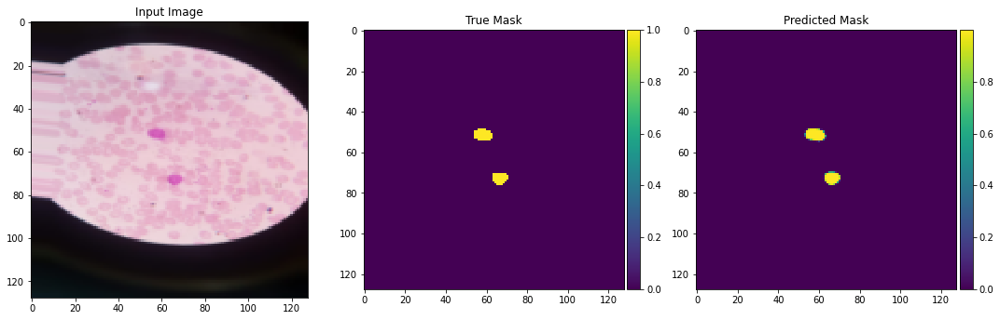


Sample Prediction after epoch 95

Epoch 96/500
28/28 [==============================] - 3s 94ms/step - loss: 0.0011 - dice_coef: 0.9454 - binary_accuracy: 0.9996 - val_loss: 0.0030 - val_dice_coef: 0.9311 - val_binary_accuracy: 0.9992

Epoch 00096: val_dice_coef did not improve from 0.94136


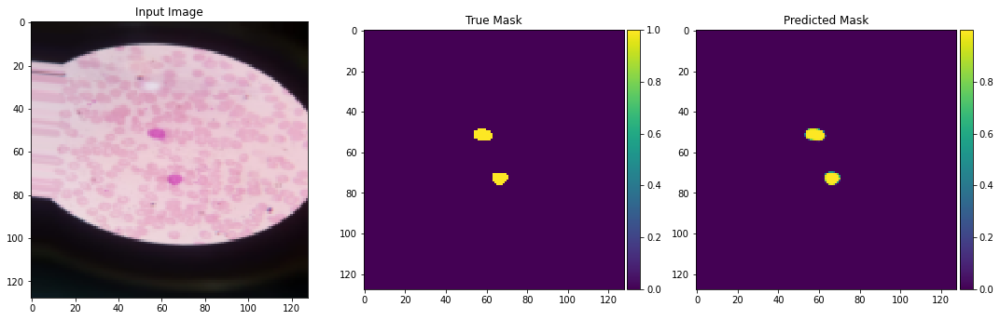


Sample Prediction after epoch 96

Epoch 97/500
28/28 [==============================] - 3s 93ms/step - loss: 0.0012 - dice_coef: 0.9371 - binary_accuracy: 0.9995 - val_loss: 0.0029 - val_dice_coef: 0.9384 - val_binary_accuracy: 0.9992

Epoch 00097: val_dice_coef did not improve from 0.94136


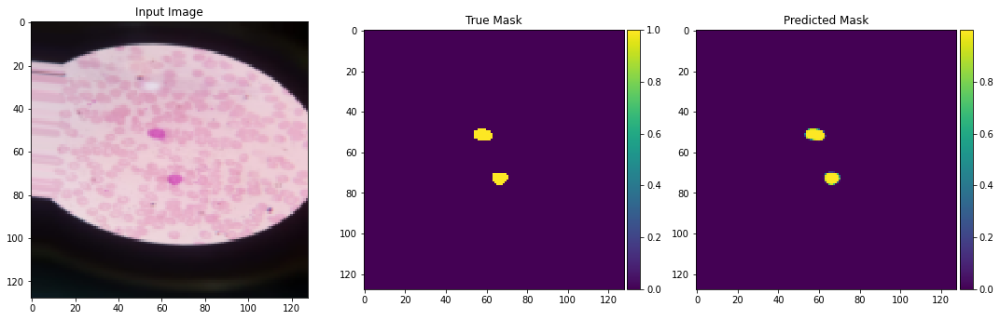


Sample Prediction after epoch 97

Epoch 00097: early stopping


Output of each layer for an image after training




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


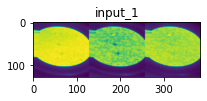

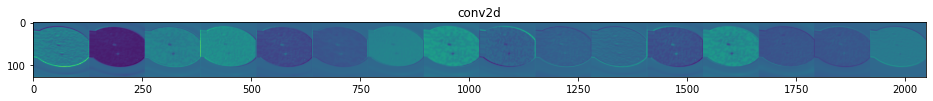

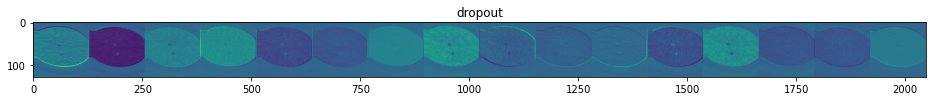

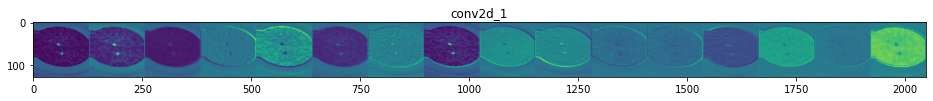

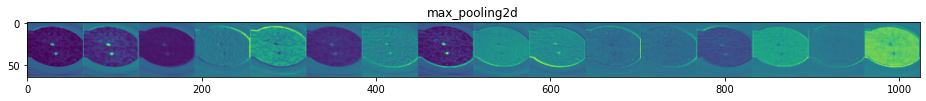

...

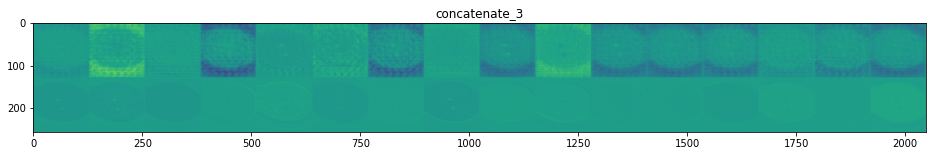

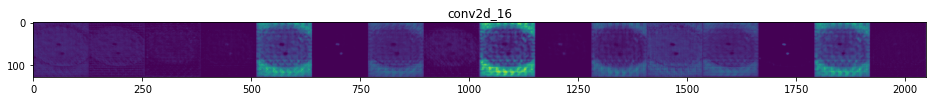

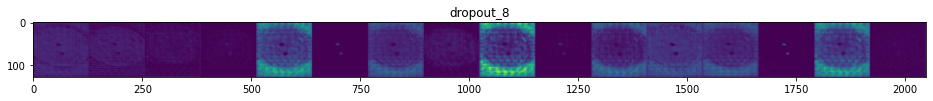

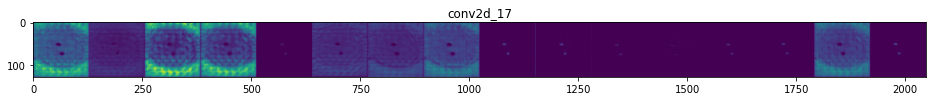

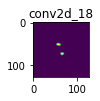

In [ ]:
#Earlystopper used to Stop training when a monitored metric has stopped improving. Thus avoiding overfitting
#Paitence 50, indicates if no improvement within 50 epochs ,stop training
earlystopper = EarlyStopping(patience=50, verbose=1)

#Save the best model based on monitored metric
checkpointer = ModelCheckpoint(os.path.join(OUTPUT_PATH ,'segmentation','model','segmentation_model.h5'), monitor='val_dice_coef', verbose=1, 
                             save_best_only=True, mode='max', save_weights_only = True)

#History records events of training such as accuracy,loss etc

#Model.fit - trains the model for fixed number of epochs
#https://www.tensorflow.org/api_docs/python/tf/keras/Model#fit

results = seg_model.fit(X_train,#input images
                        Y_train,#segmented images
                        validation_split=0.2,#20% of data use for validation
                        batch_size=32,# The batch size is a number of samples processed before the model is updated
                        epochs=500, #500 iterations over dataset
                        callbacks=[earlystopper, checkpointer,DisplayCallback()])#utilities called at certain points during model training such as train begin,epoch begin or end , etc

In [ ]:
#Plot segmentation metrics and losses and save ind drive
def plot_segm_history(history, metrics=['dice_coef', 'val_dice_coef'], losses=['loss', 'val_loss']):
    # summarize history for iou
    fig = plt.figure(figsize=(12,6))
    for metric in metrics:
        plt.plot(history.history[metric], linewidth=3)
    plt.suptitle('metrics over epochs', fontsize=20)
    plt.ylabel('metric', fontsize=20)
    plt.xlabel('epoch', fontsize=20)
    #plt.yticks(np.arange(0.3, 1, step=0.02), fontsize=35)
    #plt.xticks(fontsize=35)
    plt.legend(metrics, loc='center right', fontsize=15)
    plt.show()
    path = os.path.join(OUTPUT_PATH , 'segmentation' , 'graphs', 'metrics over epochs')
    if os.path.isfile(path):
      os.unlink(path)
    fig.savefig(path)
    # summarize history for loss
    
    fig = plt.figure(figsize=(12,6))    
    for loss in losses:
        plt.plot(history.history[loss], linewidth=3)
    plt.suptitle('loss over epochs', fontsize=20)
    plt.ylabel('loss', fontsize=20)
    plt.xlabel('epoch', fontsize=20)
    #plt.yticks(np.arange(0, 0.2, step=0.005), fontsize=35)
    #plt.xticks(fontsize=35)
    plt.legend(losses, loc='center right', fontsize=15)
    plt.show()
    path = os.path.join(OUTPUT_PATH , 'segmentation' , 'graphs', 'metrics over losses')
    if os.path.isfile(path):
      os.unlink(path)
    fig.savefig(path)

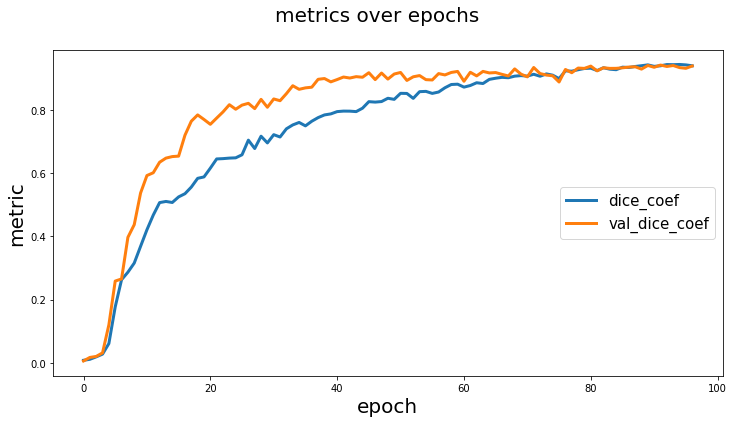

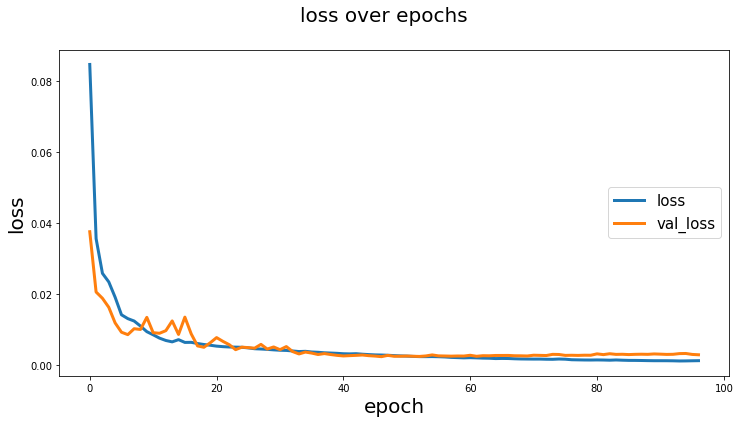

In [ ]:
plot_segm_history(results)

## Cell classification

## Cancer classification Data preparation

In [ ]:
#Cancer train images
cancer_labels = Y_train[train_ids[train_ids.str.startswith('cancer')].index]

#Non cancer train images
non_cancer_labels = np.zeros((train_ids[train_ids.str.startswith('non_cancer')].shape[0], IMG_HEIGHT, IMG_WIDTH, 1),dtype=np.bool)

#Vertically stack cancer and non cancer images to create the train inputs
classification_x_train = np.vstack((cancer_labels , non_cancer_labels))

#Vertically stack cancer and non cancer labels(True or False) to create the train outputs
classification_y_train = np.vstack((np.ones((len(cancer_labels),1) ,dtype = np.bool) , np.zeros((len(non_cancer_labels),1) ,dtype = np.bool)))

### Shuffle data

In [ ]:
classification_x_train,classification_y_train = shuffle(classification_x_train,classification_y_train)

### Prepared data shape

In [ ]:
print("X_train shape:",classification_x_train.shape)
print("Y_train shape:",classification_y_train.shape)

X_train shape: (1100, 128, 128, 1)
Y_train shape: (1100, 1)


In [ ]:
'''
classify_model = Sequential([
                    
    
    Conv2D(filters = 32, kernel_size = (3,3), activation='elu', input_shape=(IMG_HEIGHT, IMG_WIDTH ,1)),
    MaxPooling2D(pool_size = (2,2)),
    Conv2D(32, (3,3), activation='elu'),
    MaxPooling2D(2,2),
    Conv2D(64, (3,3), activation='elu'),
    MaxPooling2D(2,2),
    Flatten(),

    #
    Dense(64, activation='elu'),
    Dropout(0.7),
    Dense(1 , activation='sigmoid')
],name = 'classify_model')

classify_model.compile(loss='binary_crossentropy',
                optimizer='adam',
                metrics=['accuracy' , tf.keras.metrics.Recall(name = 'recall') , tf.keras.metrics.Precision(name = 'precision')])
'''

"\nclassify_model = Sequential([\n                    \n    \n    Conv2D(filters = 32, kernel_size = (3,3), activation='elu', input_shape=(IMG_HEIGHT, IMG_WIDTH ,1)),\n    MaxPooling2D(pool_size = (2,2)),\n    Conv2D(32, (3,3), activation='elu'),\n    MaxPooling2D(2,2),\n    Conv2D(64, (3,3), activation='elu'),\n    MaxPooling2D(2,2),\n    Flatten(),\n\n    #\n    Dense(64, activation='elu'),\n    Dropout(0.7),\n    Dense(1 , activation='sigmoid')\n],name = 'classify_model')\n\nclassify_model.compile(loss='binary_crossentropy',\n                optimizer='adam',\n                metrics=['accuracy' , tf.keras.metrics.Recall(name = 'recall') , tf.keras.metrics.Precision(name = 'precision')])\n"

In [ ]:
def get_classification_model():

    #Create a sequential model
    model = Sequential(name = 'classify_model')

    #Input of size (64 , 64, 1)
    inputs = Input((128, 128, 1))

    # Hidden layer 1 - Convoution layer

    #Perform convolution by applying 32 convolution filter of size (3,3) with stride = 1, padding = 0 to input image
    model.add(Conv2D(32, (3, 3), input_shape=(128, 128, 1)))
    #Apply Relu activation to output of previous convolution layer
    model.add(Activation('relu'))
    #Apply Max pooling to output of Relu activation with filter size = (2,2) and stride = (2,2)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Hidden layer 2 - Convoution layer

    #Perform convolution by applying 32 convolution filter of size (3,3) with stride = 1, padding = 0 to output of layer 1
    model.add(Conv2D(32, (3, 3)))
    #Apply Relu activation to output of previous convolution layer
    model.add(Activation('relu'))
    #Apply Max pooling to output of Relu activation with filter size = (2,2) and stride = (2,2)
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # hidden layer 3 - Convoution layer

    #Perform convolution by applying 32 convolution filter of size (3,3) with stride = 1, padding = 0 to output of layer 2
    model.add(Conv2D(32, (3, 3)))
    #Apply Relu activation to output of previous convolution layer
    model.add(Activation('relu'))
    #Apply Max pooling to output of Relu activation with filter size = (2,2) and stride = (2,2)
    model.add(MaxPooling2D(pool_size=(2, 2)))
    #this converts our 3D feature maps to 1D feature vectors
    model.add(Flatten())

    # Hidden layer 4- Fully connected layer / Dense layer

    model.add(Dense(64))
    #Apply Relu activation to output of previous convolution layer
    model.add(Activation('elu'))
    #Drop out 20% of the previous hidden layer output
    #model.add(Dropout(0.2))

    #Hidden layer 5 - Fully connected layer /Dense layer
    model.add(Dense(1))

    #Output
    #Apply sigmoid activation to the output of Previous dense layer(1,1) squash the output value between 0 and 1
    model.add(Activation('sigmoid'))

    #Configures the model for training by defining the loss function, the optimizer and the metrics
    #Loss function : binary_crossentropy
    #optmizer : adam
    #metrics : accuracy , recall, precision
    model.compile(loss='binary_crossentropy',
                optimizer='adam',
                metrics=['accuracy' , tf.keras.metrics.Recall(name = 'recall') , tf.keras.metrics.Precision(name = 'precision')])

    return model

In [ ]:
#Get an compiled instance of classification model
classify_model = get_classification_model()
#Classification model summary
classify_model.summary()

Model: "classify_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_19 (Conv2D)           (None, 126, 126, 32)      320       
_________________________________________________________________
activation (Activation)      (None, 126, 126, 32)      0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 61, 61, 32)        9248      
_________________________________________________________________
activation_1 (Activation)    (None, 61, 61, 32)        0         
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 30, 30, 32)        0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 28, 28, 32)     

## Classification architecure

In [ ]:

#Earlystopper used to Stop training when a monitored metric has stopped improving. Thus avoiding overfitting
#Paitence 50, indicates if no improvement within 50 epochs ,stop training
earlystopper1 = EarlyStopping(patience=10, verbose=1)

#Save the best model based on monitored metric
checkpointer1 = ModelCheckpoint(os.path.join(OUTPUT_PATH ,'classification','model','cancer_classification_model.h5'), verbose=1,monitor= 'val_loss',
                             save_best_only=True, mode='min', save_weights_only = True)

#History records events of training such as accuracy,loss etc

#Model.fit - trains the model for fixed number of epochs
#https://www.tensorflow.org/api_docs/python/tf/keras/Model#fit

history = classify_model.fit(
    x = classification_x_train,#input images
    y = classification_y_train,#Output - 1/0
    validation_split=0.2,#20% of data use for validation
    epochs=200,#200 iterations over dataset
    batch_size=32,# The batch size is a number of samples processed before the model is updated
    callbacks=[earlystopper1 , checkpointer1]) #utilities called at certain points during model training such as train begin,epoch begin or end , etc

Epoch 1/200
28/28 [==============================] - 4s 42ms/step - loss: 0.4565 - accuracy: 0.7219 - recall: 0.8913 - precision: 0.6976 - val_loss: 0.2126 - val_accuracy: 1.0000 - val_recall: 0.9866 - val_precision: 0.8305

Epoch 00001: val_loss improved from inf to 0.21262, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/classification/model/cancer_classification_model.h5
Epoch 2/200
28/28 [==============================] - 0s 14ms/step - loss: 0.2413 - accuracy: 1.0000 - recall: 0.9898 - precision: 0.8668 - val_loss: 0.1558 - val_accuracy: 1.0000 - val_recall: 0.9936 - val_precision: 0.9124

Epoch 00002: val_loss improved from 0.21262 to 0.15578, saving model to /gdrive/My Drive/projects/cancer_detection/outputs/classification/model/cancer_classification_model.h5
Epoch 3/200
28/28 [==============================] - 0s 14ms/step - loss: 0.1706 - accuracy: 1.0000 - recall: 0.9945 - precision: 0.9235 - val_loss: 0.1027 - val_accuracy: 1.0000 - val_recall: 0.9958 - va

In [ ]:
  ### View layer output
  
  
  # Extracts all ayers except input and output layer
  layer_outputs = [layer.output for layer in classify_model.layers]

  # Creates a model that will return these outputs, given the model input
  activation_model = Model(inputs=classify_model.input, outputs=layer_outputs)

  # Activations of all 40 layers for a selected input image
  activations = activation_model.predict(np.expand_dims(classification_x_train[0] ,axis=0 ))
  activations

[array([[[[-0.00155709, -0.00740935, -0.01372958, ..., -0.00015108,
           -0.00626436,  0.00010755],
          [-0.00155709, -0.00740935, -0.01372958, ..., -0.00015108,
           -0.00626436,  0.00010755],
          [-0.00155709, -0.00740935, -0.01372958, ..., -0.00015108,
           -0.00626436,  0.00010755],
          ...,
          [-0.00155709, -0.00740935, -0.01372958, ..., -0.00015108,
           -0.00626436,  0.00010755],
          [-0.00155709, -0.00740935, -0.01372958, ..., -0.00015108,
           -0.00626436,  0.00010755],
          [-0.00155709, -0.00740935, -0.01372958, ..., -0.00015108,
           -0.00626436,  0.00010755]],
 
         [[-0.00155709, -0.00740935, -0.01372958, ..., -0.00015108,
           -0.00626436,  0.00010755],
          [-0.00155709, -0.00740935, -0.01372958, ..., -0.00015108,
           -0.00626436,  0.00010755],
          [-0.00155709, -0.00740935, -0.01372958, ..., -0.00015108,
           -0.00626436,  0.00010755],
          ...,
          [-0

### Classification metrics and loss plots

In [ ]:
#Plot classification metrics and loss
def classification_plot(history):
  #Get accurcay from training output
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  #Get recall from training output
  recall = history.history['recall']
  val_recall = history.history['val_recall']

  #Get precision from training output
  precision = history.history['precision']
  val_precision = history.history['val_precision']

  #get loss from training loss
  loss=history.history['loss']
  val_loss=history.history['val_loss']

  epochs_range = range(len(history.epoch))

  fig = plt.figure(figsize=(16, 8))
  plt.subplot(1, 4, 1)
  plt.ylabel('metric', fontsize=20)
  plt.xlabel('epoch', fontsize=20)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(1, 4, 2)
  plt.plot(epochs_range, recall, label='Training Recall')
  plt.plot(epochs_range, val_recall, label='Validation Recall')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Recall')

  plt.subplot(1, 4, 3)
  plt.plot(epochs_range, precision, label='Training Precision')
  plt.plot(epochs_range, val_precision, label='Validation Precision')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Precision')

  plt.subplot(1, 4, 4)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.tight_layout()
  plt.show()

  path = os.path.join(OUTPUT_PATH , 'classification' , 'graphs', 'metrics_and_losses')
  if os.path.isfile(path):
    os.unlink(path)
  fig.savefig(path)

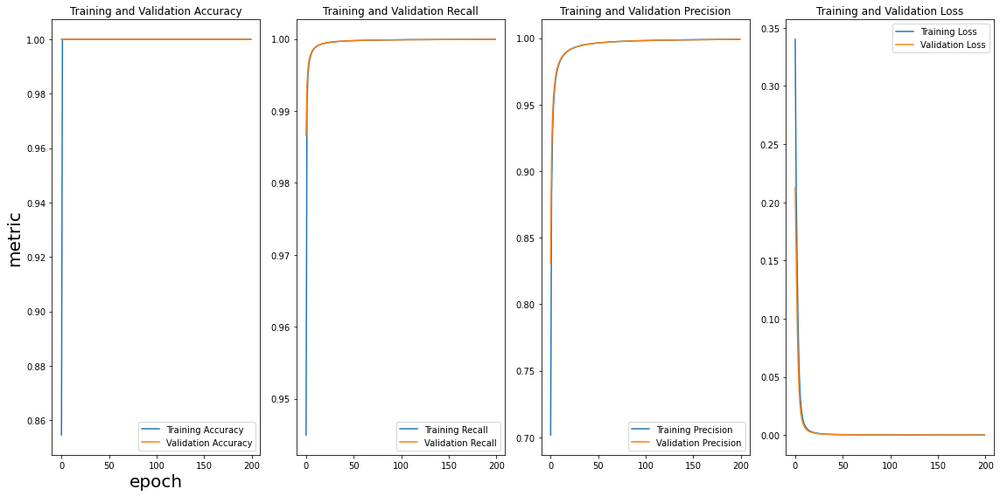

In [ ]:
classification_plot(history)

## Evaluation and prediction with unseen data

In [ ]:
#Path of test imgages
TEST_PATH = '/gdrive/My Drive/projects/cancer_detection/test/images/'

In [ ]:
#Get test filenames from the folder
test_ids = pd.Series(os.listdir(TEST_PATH))

test_ids.head()

0         cancer_3.jpg
1        cancer_31.jpg
2     non_cancer_8.jpg
3    non_cancer_10.jpg
4     non_cancer_5.jpg
dtype: object

In [ ]:
#Intialise numpy array of size (len(test_ids),128,128,3) - This will be test set of images
X_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS) , dtype = np.float32)

#Y_Test is used for evaluation of the X_test. If the purpose is to predict for new cancer images.Skip it
Y_test = np.zeros((len(test_ids), 1) ,dtype= np.bool)
print('Getting and resizing train images and set label values... ')

#Load test data to defined numpy arrays X_test and Y_test
for n, id_ in notebook.tqdm(enumerate(shuffle(test_ids)), total=len(test_ids)):
    #path = TRAIN_PATH + id_
    img = imread(fname = TEST_PATH + id_ )[:,:,:IMG_CHANNELS]
  
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH))
    X_test[n] = img

    if(id_.startswith('cancer')):
      Y_test[n] = 1
print("done!")

Getting and resizing train images and set label values... 



done!


### Test data shape

In [ ]:
print("X_test shape:",X_test.shape)
print("Y_test shape:",Y_test.shape)

X_test shape: (31, 128, 128, 3)
Y_test shape: (31, 1)


### Prediction

In [ ]:
#Get an instance of compiled trained segmentation model
segmentation_model = get_seg_model()

#Load weights of the CNN model from previously saved model
segmentation_model.load_weights(os.path.join(OUTPUT_PATH ,'segmentation','model','segmentation_model.h5'))

#Predict and get segmentation output for X_test
Y_pred_mask = segmentation_model.predict(X_test)

#Get an instance of compiled classification model
classification_model = get_classification_model()

#Load weights of classification model from prevoiously saved model during training
classification_model.load_weights(os.path.join(OUTPUT_PATH ,'classification','model','cancer_classification_model.h5'))

#Predict the classfication output for the segmented images
Y_pred = classification_model.predict(Y_pred_mask)

In [ ]:
#Optional - can be used to determine sigmoid threshold for deciding cancer or not.We have used a differnet way
fpr, tpr, thresholds = roc_curve(Y_test , Y_pred)

#Classification threshold for the dataset
thresholds[np.argmax(tpr - fpr) ]


1.0

In [ ]:
#Evaluate by comparing y_predicted to y_actual
accuracy = accuracy_score(np.squeeze(Y_test),np.squeeze(Y_pred.round().astype(np.bool)))
precision = precision_score(np.squeeze(Y_test),np.squeeze(Y_pred.round().astype(np.bool)))
recall = recall_score(np.squeeze(Y_test),np.squeeze(Y_pred.round().astype(np.bool)))


print ("\nAccuracy score: -  set of labels predicted for a sample must exactly match the corresponding set of labels in y_true:",accuracy)
print ("Precision score:- ability of the classifier not to label as positive a sample that is negative:",precision)
print ("Recall score:-  ability of the classifier to find all the positive samples:",recall)

print ("\nConfusion matrix - shows the ways in which your classification model is confused when it makes predictions.")

df_confusion = pd.crosstab(pd.Series(np.squeeze(Y_test),name='Actual'), pd.Series(np.squeeze(Y_pred.round().astype(np.bool)),name='predicted'))

#Understanding confusion matrix with actual in index and predicted in columns
#(0,0) - True negative(tn), (1,1) - True positive(tp) , (0,1) - False positive(fp) , (1,0) - False negative(fn)

#Accuracy = (tp + tn) / (tp + tn + fp + fn)
#Precision = tp / (tp + fp)
#Recall = tp/ (tp+ fn)  
print("-------------------")
print(df_confusion)


Accuracy score: -  set of labels predicted for a sample must exactly match the corresponding set of labels in y_true: 1.0
Precision score:- ability of the classifier not to label as positive a sample that is negative: 1.0
Recall score:-  ability of the classifier to find all the positive samples: 1.0

Confusion matrix - shows the ways in which your classification model is confused when it makes predictions.
-------------------
predicted  False  True 
Actual                 
False         15      0
True           0     16


In [ ]:
#Show segmentation output and cancer or not label for X_test
def show_final_prediction(X_test ,Y_pred_mask, Y_pred):

  #Save the output in drive
  predictions_path = os.path.join(OUTPUT_PATH,'predictions')

  if not(os.path.isdir(predictions_path)):
    os.mkdir(predictions_path)
  else:
    delete_folder_contents(predictions_path)
  
  for n,(original , predicted_mask , predicted_output) in enumerate(zip(X_test ,Y_pred_mask, Y_pred)):
    fig = plt.figure(figsize=(8,8))
    plt.subplot( 1 ,2 , 1)
    plt.title('input image')
    plt.imshow(np.squeeze(original))
    plt.subplot( 1 ,2 , 2)
    if (predicted_output > 0.5):
      title = 'cancer with ' + str(np.round(predicted_output[0]*100 ,decimals =2)) + "% confidence"
    else:
      title = 'non_cancer with ' + str(np.round((1 - (predicted_output[0]))*100 , decimals =2)) + "% confidence"
    plt.title(title)
    plt.imshow(np.squeeze(predicted_mask))

    fig.savefig(os.path.join(predictions_path , 'prediction_'+ str(n)))
    plt.show()




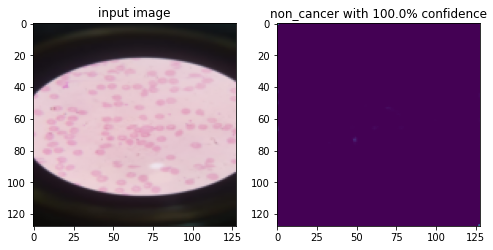

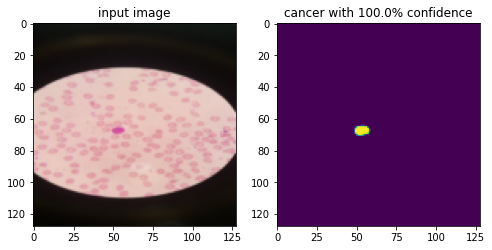

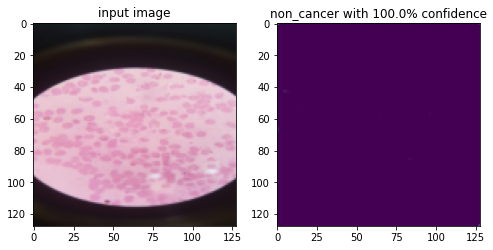

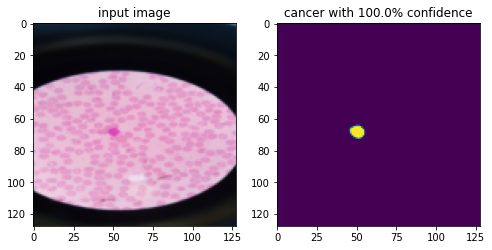

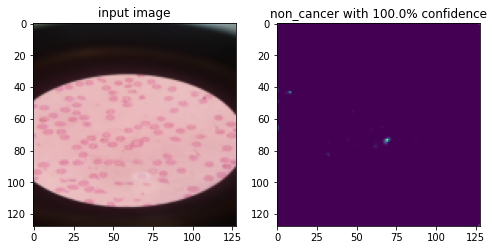

...

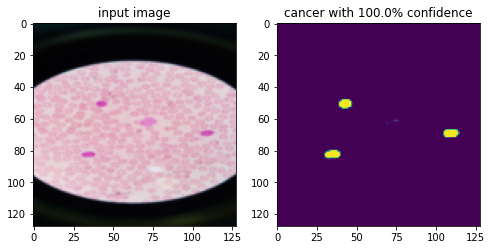

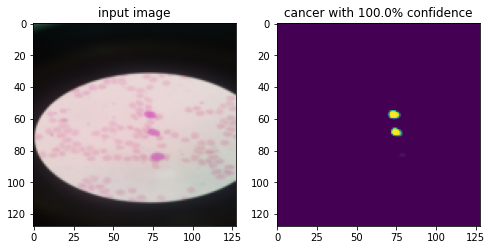

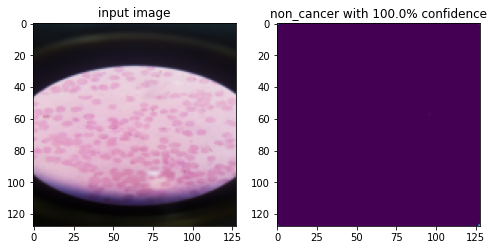

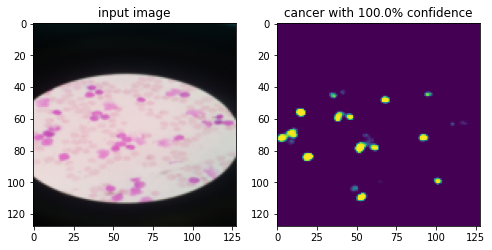

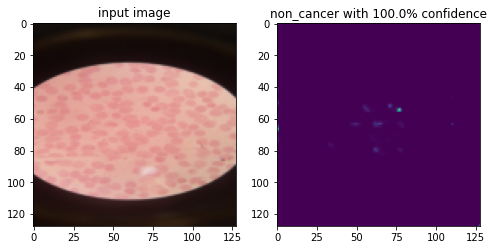

In [ ]:
show_final_prediction(X_test ,Y_pred_mask, Y_pred)